# Course Project &mdash; Isaac Joffe and Benjamin Colussi

### CS 679: Neural Networks


## Introduction

This Jupyter notebook contains code to demonstrate the functioning of our reimplementation of `MONet`, presented by Burgess et al. in ["MONet: Unsupervised Scene Decomposition and Representation"](https://arxiv.org/abs/1901.11390).

This notebook goes through each of the major variations of the model that we trained and shows some random examples of the outputs these models generate for different datasets.

## Preliminaries

### Source Code

The source code that implements the models themselves, along with the source code used to train and test the models, are contained within `monet.py`, `monet_normask.py`, and `monet_mini.py`; explainers for each of these models are available within `monet.ipynb`, `monet_normask.ipynb`, and `monet_mini.ipynb`. All code is thoroughly documented within each file, and each file includes examples of how to train the model using a command-line invocation of the program (for example, the command used to train one version of the model was `python monet.py --n MONet_ObjectsRoom --m Train --d ObjectsRoom --s 5 --b 128 --e 1000 --l 0.0001`). The model was developed entirely using PyTorch.

### Training Details

Training the model requires a very powerful GPU. All models were trained on a single NVIDIA RTX 6000 Ada Generation GPU (for around 12 hours each) using WatGPU. Because of these extreme computational demands, we only show examples of the inference of our trained models (and not the actual training process) in this notebook; the training process and code is explained in the code files and other notebooks. Even model inference is slow, so this notebook may take several minutes to run.


In [1]:
# Isaac Joffe and Benjamin Colussi, 2025


# PyTorch libraries
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import transforms as T
# Dataset libraries
from multi_object_datasets_torch import ClevrWithMasks, MultiDSprites, ObjectsRoom, Tetrominoes
from arc_data import ARCAGI
# Other libraries
import matplotlib.pyplot as plt
# Our code
import monet
import monet_normask
import monet_mini


# Fetch and display system information
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device being used: {device}")

# Ensure reproducibility
torch.manual_seed(0)
torch.cuda.manual_seed(0)


Device being used: cpu
Device being used: cpu
Device being used: cpu.
Device being used: cpu


In [2]:
# Function to display summaries of example model outputs (for the original version of MONet)
def show_n_examples(n_examples, model, images):

    # Perform forward pass, computing model outputs without tracking training information
    with torch.no_grad():
        # Perform complete forward pass of the complete model
        _, _, log_masks, recon_comp_means, recon_mask_logits = model(images)
        # Translate the data into a more useful format for visualization
        masks = torch.exp(log_masks)
        recon_comps = recon_comp_means
        recon_masks = nn.Softmax(dim=0)(recon_mask_logits)

    # Generate a well-formatted summary image for each
    for i in range(n_examples):
        # Summarize outputs as an image composed of a mosaic of images
        # Top row is the original image and reconstructed image 
        mosaic = [["original", "original", "original", "original", "original", "reconstruction", "reconstruction", "reconstruction", "reconstruction", "reconstruction"]]
        # Each subsequent row of images summarizes each of the K slots in the model
        for k in range(model.K):
            # First mask, then reconstructed-mask, then reconstructed-component, then masked reconstructed-component, and finally reconstructed-masked reconstructed-component
            mosaic.append([f"mask_{k}", f"mask_{k}", f"recon_mask_{k}", f"recon_mask_{k}", f"recon_comp_{k}", f"recon_comp_{k}", f"recon_comp_mask_{k}", f"recon_comp_mask_{k}", f"recon_comp_recon_mask_{k}", f"recon_comp_recon_mask_{k}"])
        # Generate mosaic of images
        _, axes = plt.subplot_mosaic(
            mosaic,
            height_ratios=[2.5] + [1] * model.K,       # Top images must be larger since there are only 2 (compared to 5)
            gridspec_kw={"wspace": 0, "hspace": 0},    # Ensure padding around images is tight
            constrained_layout=True,                   # Ensure padding around images is tight
            figsize=(
                5 * 3 + 1,                             # Each image is 3*3, 5 columns, pad with 1
                model.K * 3 + 1 + 8,                   # Each image is 3*3, K rows, pad with 1, add 8 for top row
            ),
        )

        # Display original image prominently
        axes["original"].imshow(images[i].permute(1, 2, 0))
        axes["original"].set_title("Original", fontsize=25)
        # Display model's reconstructed image prominently (main result)
        axes["reconstruction"].imshow(torch.clamp(torch.sum(torch.mul(masks[:,i], recon_comps[:,i]), dim=0).permute(1, 2, 0), min=0, max=1))
        axes["reconstruction"].set_title("Reconstruction", fontsize=25)

        # Display labels for each column of the slot summary
        axes["mask_0"].set_title("Mask", fontsize=20)
        axes["recon_mask_0"].set_title("Recon.-Mask", fontsize=20)
        axes["recon_comp_0"].set_title("Recon.-Comp.", fontsize=20)
        axes["recon_comp_mask_0"].set_title("Masked Recon.-Comp.", fontsize=20)
        axes["recon_comp_recon_mask_0"].set_title("R.-Masked R.-Comp.", fontsize=20)

        # Generate required summary plots for each slot
        for k in range(model.K):
            # Display label for each slot
            axes[f"mask_{k}"].set_ylabel(f"S{k}", rotation=0, va="center", labelpad=15, fontsize=20)
            # Display image for each important feature of plot
            axes[f"mask_{k}"].imshow(torch.clamp(masks[k][i].permute(1, 2, 0), min=0, max=1), cmap="gray")
            axes[f"recon_mask_{k}"].imshow(torch.clamp(recon_masks[k][i].permute(1, 2, 0), min=0, max=1), cmap="gray")
            axes[f"recon_comp_{k}"].imshow(torch.clamp(recon_comps[k][i].permute(1, 2, 0), min=0, max=1))
            axes[f"recon_comp_mask_{k}"].imshow(torch.clamp(torch.mul(masks[k][i], recon_comps[k][i]).permute(1, 2, 0), min=0, max=1))
            axes[f"recon_comp_recon_mask_{k}"].imshow(torch.clamp(torch.mul(recon_masks[k][i], recon_comps[k][i]).permute(1, 2, 0), min=0, max=1))

        # Set up figures to have proper formatting (no axis ticks/labels and square images)
        for key in axes.keys():
            axes[key].set_xticks([])
            axes[key].set_xticklabels([])
            axes[key].set_yticks([])
            axes[key].set_yticklabels([])
            axes[key].set_aspect("equal")

        # Save summary image
        print(f"Sample #{i+1}:")
        plt.show()
        plt.close()

    return


# Function to display summaries of example model outputs (for the NoRMask version of MONet)
def show_n_examples_normask(n_examples, model, images):

    # Perform forward pass, computing model outputs without tracking training information
    with torch.no_grad():
        # Perform complete forward pass of the complete model
        _, _, log_masks, recon_comp_means = model(images)
        # Translate the data into a more useful format for visualization
        masks = torch.exp(log_masks)
        recon_comps = recon_comp_means

    # Generate a well-formatted summary image for each
    for i in range(n_examples):
        # Summarize outputs as an image composed of a mosaic of images
        # Top row is the original image and reconstructed image 
        mosaic = [["original", "original", "original", "reconstruction", "reconstruction", "reconstruction"]]
        # Each subsequent row of images summarizes each of the K slots in the model
        for k in range(model.K):
            # First mask, then reconstructed-component, and then masked reconstructed-component
            mosaic.append([f"mask_{k}", f"mask_{k}", f"recon_comp_{k}", f"recon_comp_{k}", f"recon_comp_mask_{k}", f"recon_comp_mask_{k}"])
        # Generate mosaic of images
        _, axes = plt.subplot_mosaic(
            mosaic,
            height_ratios=[1.5] + [1] * model.K,       # Top images must be larger since there are only 2 (compared to 3)
            gridspec_kw={"wspace": 0, "hspace": 0},    # Ensure padding around images is tight
            constrained_layout=True,                   # Ensure padding around images is tight
            figsize=(
                3 * 3 + 1,                             # Each image is 3*3, 3 columns, pad with 1
                model.K * 3 + 1 + 5,                   # Each image is 3*3, K rows, pad with 1, add 5 for top row
            ),
        )

        # Display original image prominently
        axes["original"].imshow(images[i].permute(1, 2, 0))
        axes["original"].set_title("Original", fontsize=25)
        # Display model's reconstructed image prominently (main result)
        axes["reconstruction"].imshow(torch.clamp(torch.sum(torch.mul(masks[:,i], recon_comps[:,i]), dim=0).permute(1, 2, 0), min=0, max=1))
        axes["reconstruction"].set_title("Reconstruction", fontsize=25)

        # Display labels for each column of the slot summary
        axes["mask_0"].set_title("Mask", fontsize=20)
        axes["recon_comp_0"].set_title("Recon.-Comp.", fontsize=20)
        axes["recon_comp_mask_0"].set_title("Masked Recon.-Comp.", fontsize=20)

        # Generate required summary plots for each slot
        for k in range(model.K):
            # Display label for each slot
            axes[f"mask_{k}"].set_ylabel(f"S{k}", rotation=0, va="center", labelpad=15, fontsize=20)
            # Display image for each important feature of plot
            axes[f"mask_{k}"].imshow(torch.clamp(masks[k][i].permute(1, 2, 0), min=0, max=1), cmap="gray")
            axes[f"recon_comp_{k}"].imshow(torch.clamp(recon_comps[k][i].permute(1, 2, 0), min=0, max=1))
            axes[f"recon_comp_mask_{k}"].imshow(torch.clamp(torch.mul(masks[k][i], recon_comps[k][i]).permute(1, 2, 0), min=0, max=1))

        # Set up figures to have proper formatting (no axis ticks/labels and square images)
        for key in axes.keys():
            axes[key].set_xticks([])
            axes[key].set_xticklabels([])
            axes[key].set_yticks([])
            axes[key].set_yticklabels([])
            axes[key].set_aspect("equal")

        # Save summary image
        print(f"Sample #{i+1}:")
        plt.show()
        plt.close()

    return


# Function to display summaries of example model outputs (for the mini version of MONet)
def show_n_examples_mini(n_examples, model, images):

    # Perform forward pass, computing model outputs without tracking training information
    with torch.no_grad():
        # Perform complete forward pass of the complete model
        _, _, log_masks, recon_comp_means, recon_mask_logits = model(images)
        # Translate the data into a more useful format for visualization
        masks = torch.exp(log_masks)
        recon_comps = recon_comp_means
        recon_masks = nn.Softmax(dim=0)(recon_mask_logits)

    # Generate a well-formatted summary image for each
    for i in range(n_examples):
        # Summarize outputs as an image composed of a mosaic of images
        # Top row is the original image and reconstructed image 
        mosaic = [["original", "original", "original", "original", "original", "reconstruction", "reconstruction", "reconstruction", "reconstruction", "reconstruction"]]
        # Each subsequent row of images summarizes each of the K slots in the model
        for k in range(model.K):
            # First mask, then reconstructed-mask, then reconstructed-component, then masked reconstructed-component, and finally reconstructed-masked reconstructed-component
            mosaic.append([f"mask_{k}", f"mask_{k}", f"recon_mask_{k}", f"recon_mask_{k}", f"recon_comp_{k}", f"recon_comp_{k}", f"recon_comp_mask_{k}", f"recon_comp_mask_{k}", f"recon_comp_recon_mask_{k}", f"recon_comp_recon_mask_{k}"])
        # Generate mosaic of images
        _, axes = plt.subplot_mosaic(
            mosaic,
            height_ratios=[2.5] + [1] * model.K,       # Top images must be larger since there are only 2 (compared to 5)
            gridspec_kw={"wspace": 0, "hspace": 0},    # Ensure padding around images is tight
            constrained_layout=True,                   # Ensure padding around images is tight
            figsize=(
                5 * 3 + 1,                             # Each image is 3*3, 5 columns, pad with 1
                model.K * 3 + 1 + 8,                   # Each image is 3*3, K rows, pad with 1, add 8 for top row
            ),
        )

        # Display original image prominently
        axes["original"].imshow(images[i].permute(1, 2, 0))
        axes["original"].set_title("Original", fontsize=25)
        # Display model's reconstructed image prominently (main result)
        axes["reconstruction"].imshow(torch.clamp(torch.sum(torch.mul(masks[:,i], recon_comps[:,i]), dim=0).permute(1, 2, 0), min=0, max=1))
        axes["reconstruction"].set_title("Reconstruction", fontsize=25)

        # Display labels for each column of the slot summary
        axes["mask_0"].set_title("Mask", fontsize=20)
        axes["recon_mask_0"].set_title("Recon.-Mask", fontsize=20)
        axes["recon_comp_0"].set_title("Recon.-Comp.", fontsize=20)
        axes["recon_comp_mask_0"].set_title("Masked Recon.-Comp.", fontsize=20)
        axes["recon_comp_recon_mask_0"].set_title("R.-Masked R.-Comp.", fontsize=20)

        # Generate required summary plots for each slot
        for k in range(model.K):
            # Display label for each slot
            axes[f"mask_{k}"].set_ylabel(f"S{k}", rotation=0, va="center", labelpad=15, fontsize=20)
            # Display image for each important feature of plot
            axes[f"mask_{k}"].imshow(torch.clamp(masks[k][i].permute(1, 2, 0), min=0, max=1), cmap="gray")
            axes[f"recon_mask_{k}"].imshow(torch.clamp(recon_masks[k][i].permute(1, 2, 0), min=0, max=1), cmap="gray")
            axes[f"recon_comp_{k}"].imshow(torch.clamp(recon_comps[k][i].permute(1, 2, 0), min=0, max=1))
            axes[f"recon_comp_mask_{k}"].imshow(torch.clamp(torch.mul(masks[k][i], recon_comps[k][i]).permute(1, 2, 0), min=0, max=1))
            axes[f"recon_comp_recon_mask_{k}"].imshow(torch.clamp(torch.mul(recon_masks[k][i], recon_comps[k][i]).permute(1, 2, 0), min=0, max=1))

        # Set up figures to have proper formatting (no axis ticks/labels and square images)
        for key in axes.keys():
            axes[key].set_xticks([])
            axes[key].set_xticklabels([])
            axes[key].set_yticks([])
            axes[key].set_yticklabels([])
            axes[key].set_aspect("equal")

        # Save summary image
        print(f"Sample #{i+1}:")
        plt.show()
        plt.close()

    return


In [3]:
# Function to compute metrics about model outputs (for the original version of MONet)
def show_metrics(model, dataset):
    
    # Convert dataset into more processable form
    dataloader = DataLoader(
        dataset,
        batch_size=model.batch_size,
        num_workers=0,
        shuffle=False,
    )

    # Track MSE scores for entire testing dataset
    mse_scores = torch.Tensor([])

    # Generate predictions for the entire dataset
    for i, x in enumerate(dataloader):
        # Extract image from testing data (unsupervised, so this is all that is needed)
        image = (x["image"] / 255).to(device)
        # Only deal with complete batches for simplicity's sake
        if image.shape[0] != model.batch_size:
            break

        # Perform forward pass, computing model outputs without tracking training information
        with torch.no_grad():
            # Perform complete forward pass of the complete model
            _, _, log_masks, recon_comp_means, recon_mask_logits = model(image)
            # Translate the data into a more useful format for visualization
            masks = torch.exp(log_masks)
            recon_comps = recon_comp_means
            recon_masks = nn.Softmax(dim=0)(recon_mask_logits)

        # Compute MSE scores for this batch and add it to tracked total
        batch_scores = torch.zeros((model.batch_size))
        for j in range(model.batch_size):
            batch_scores[j] = torch.mean(torch.square(torch.clamp(torch.sum(torch.mul(masks[:,j], recon_comps[:,j]), dim=0), min=0, max=1) - image[j]))
        mse_scores = torch.cat((mse_scores, batch_scores), dim=0)

    # Display and save summary of results
    print(f"Average MSE Score: {torch.mean(mse_scores):.5f}")
    return torch.mean(mse_scores).detach().numpy()


# Function to compute metrics about model outputs (for the NoRMask version of MONet)
def show_metrics_normask(model, dataset):
    
    # Convert dataset into more processable form
    dataloader = DataLoader(
        dataset,
        batch_size=model.batch_size,
        num_workers=0,
        shuffle=False,
    )

    # Track ARI and MSE scores for entire testing dataset
    mse_scores = torch.Tensor([])

    # Generate predictions for the entire dataset
    for i, x in enumerate(dataloader):
        # Extract image from testing data (unsupervised, so this is all that is needed)
        image = (x["image"] / 255).to(device)
        # Only deal with complete batches for simplicity's sake
        if image.shape[0] != model.batch_size:
            break

        # Perform forward pass, computing model outputs without tracking training information
        with torch.no_grad():
            # Perform complete forward pass of the complete model
            _, _, log_masks, recon_comp_means = model(image)
            # Translate the data into a more useful format for visualization
            masks = torch.exp(log_masks)
            recon_comps = recon_comp_means

        # Compute MSE scores for this batch and add it to tracked total
        batch_scores = torch.zeros((model.batch_size))
        for j in range(model.batch_size):
            batch_scores[j] = torch.mean(torch.square(torch.clamp(torch.sum(torch.mul(masks[:,j], recon_comps[:,j]), dim=0), min=0, max=1) - image[j]))
        mse_scores = torch.cat((mse_scores, batch_scores), dim=0)

    # Display and save summary of results
    print(f"Average MSE Score: {torch.mean(mse_scores):.5f}")
    return torch.mean(mse_scores).detach().numpy()


# Function to compute metrics about model outputs (for the mini version of MONet)
def show_metrics_mini(model, dataset):
    
    # Convert dataset into more processable form
    dataloader = DataLoader(
        dataset,
        batch_size=model.batchsize,
        num_workers=0,
        shuffle=False,
    )

    # Track MSE scores for entire testing dataset
    mse_scores = torch.Tensor([])

    # Generate predictions for the entire dataset
    for i, x in enumerate(dataloader):
        # Extract image from testing data (unsupervised, so this is all that is needed)
        image = (x["image"] / 255).to(device)
        # Only deal with complete batches for simplicity's sake
        if image.shape[0] != model.batchsize:
            break

        # Perform forward pass, computing model outputs without tracking training information
        with torch.no_grad():
            # Perform complete forward pass of the complete model
            _, _, log_masks, recon_comp_means, recon_mask_logits = model(image)
            # Translate the data into a more useful format for visualization
            masks = torch.exp(log_masks)
            recon_comps = recon_comp_means
            recon_masks = nn.Softmax(dim=0)(recon_mask_logits)

        # Compute MSE scores
        # Compute MSE scores for this batch and add it to tracked total
        batch_scores = torch.zeros((model.batchsize))
        for j in range(model.batchsize):
            batch_scores[j] = torch.mean(torch.square(torch.clamp(torch.sum(torch.mul(masks[:,j], recon_comps[:,j]), dim=0), min=0, max=1) - image[j]))
        mse_scores = torch.cat((mse_scores, batch_scores), dim=0)

    # Display and save summary of results
    print(f"Average MSE Score: {torch.mean(mse_scores):.5f}")
    return torch.mean(mse_scores).detach().numpy()


## Data

### Main Datasets

Two main datasets were used to train and test the model (in both the original paper as well as our reimplementation): [`MultiDSprites`](https://github.com/google-deepmind/multi_object_datasets/blob/master/README.md#multi-dsprites) and [`ObjectsRoom`](https://github.com/google-deepmind/multi_object_datasets/blob/master/README.md#objects-room). Both of these datasets are [available](https://github.com/google-deepmind/multi_object_datasets) from Google DeepMind in TensorFlow (but with corresponding [PyTorch versions](https://github.com/JohannesTheo/multi_object_datasets_torch)).

#### MultiDSprites

One of the main datasets used to train and test the model (in both the original paper as well as our reimplementation) was [`MultiDSprites`](https://github.com/google-deepmind/multi_object_datasets/blob/master/README.md#multi-dsprites). This synthetically-generated dataset consists of images of a variable number of abstract two-dimensional shapes (sprites) placed randomly on a uniform (either random colour or random grayscale) background. There are 100,000 samples (90,000 for training) in each version.

#### ObjectsRoom

The other main dataset used to train and test the model (in both the original paper as well as our reimplementation) was [`ObjectsRoom`](https://github.com/google-deepmind/multi_object_datasets/blob/master/README.md#objects-room). This synthetically-generated dataset consists of images of a variable number of abstract three-dimensional shapes (blocks) placed randomly in a plain three-dimensional room background. There are 100,000 samples (90,000 for training) in the main dataset, as well as three out-of-distribution versions with 922 testing samples each.

### Other Datasets

A few other datasets were used throughout our project. Two of these, [`CLEVR`](https://github.com/google-deepmind/multi_object_datasets/blob/master/README.md#clevr-with-masks) and [`Tetrominoes`](https://github.com/google-deepmind/multi_object_datasets/blob/master/README.md#tetrominoes), are also [available](https://github.com/google-deepmind/multi_object_datasets) from Google DeepMind in TensorFlow (but with corresponding [PyTorch versions](https://github.com/JohannesTheo/multi_object_datasets_torch)).

#### ARCAGI

Additionally, we constructed our own custom datasets comprising [all `ARC-AGI` grids](https://github.com/fchollet/ARC-AGI). To build these datasets, we converted each grid in the original `ARC-AGI` dataset (including all demonstration and trial input and output grids for each task, with sizes ranging from 1$\times$1 to 30$\times$30 in size) into a 64$\times$64-pixel image (in three ways: rescaling with nearest-neighbour interpolation, simple padding, and padding with centering). This process produced three versions of a training dataset containing 3436 images and three versions of a testing dataset containing 3564 images. While appreciable in size, these datasets are smaller than the standard for this field (for example, the datasets listed above each contain 90,000 traning images and 5,000 testing images), and, thus, training `MONet` on only this data proved difficult. However, these datasets still represent a useful testbed for the model's performance on our specific downstream task.


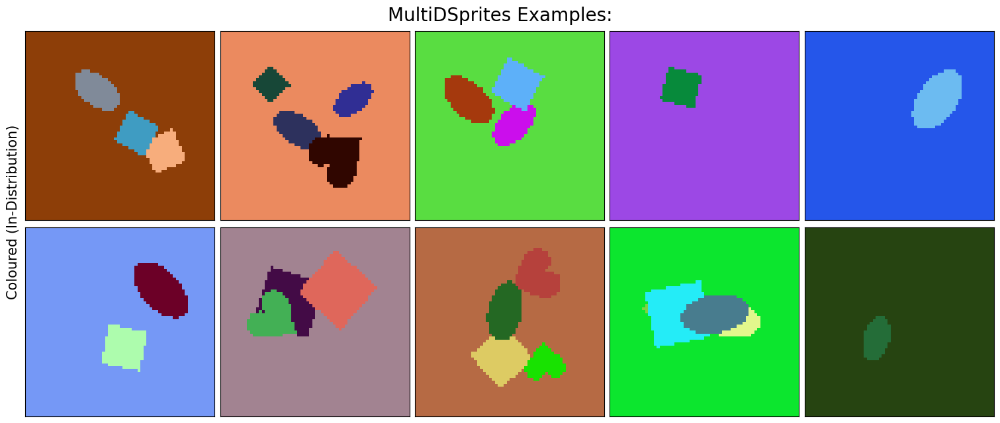

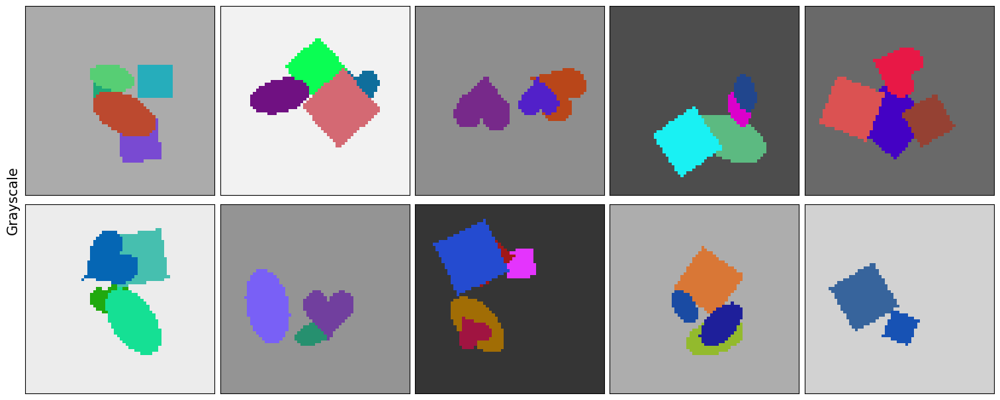

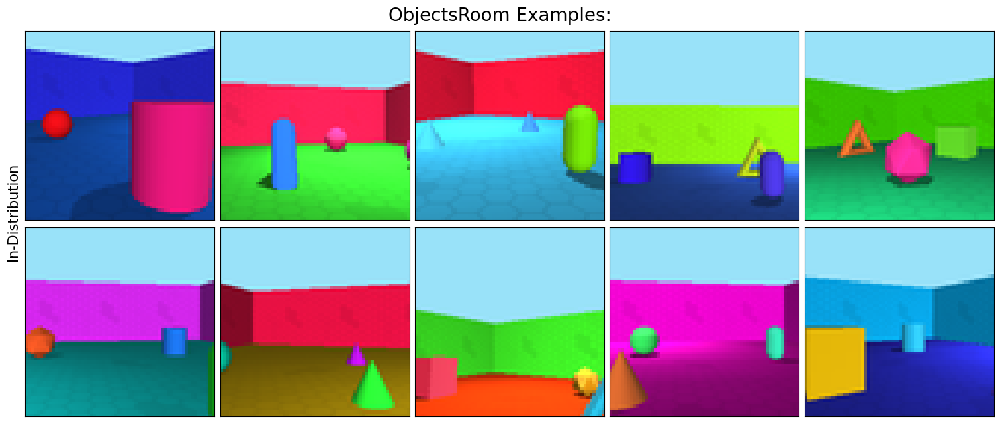

INFO: 'empty_room' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.
INFO: 'identical_color' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.
INFO: 'six_objects' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.


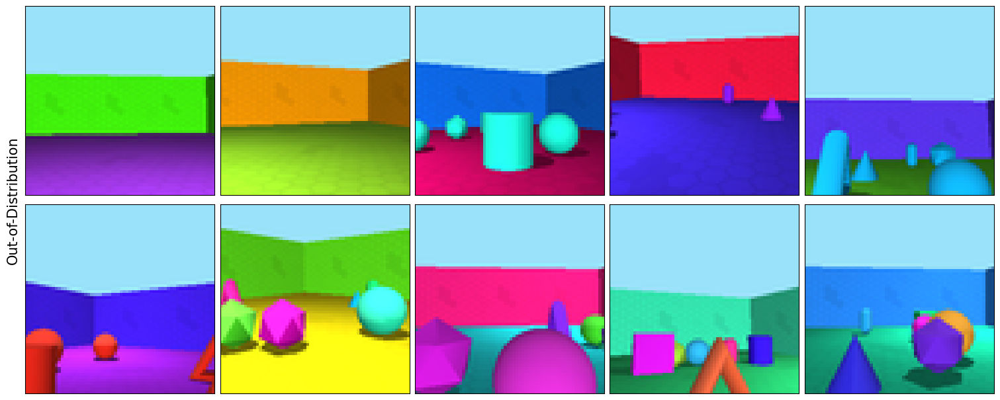

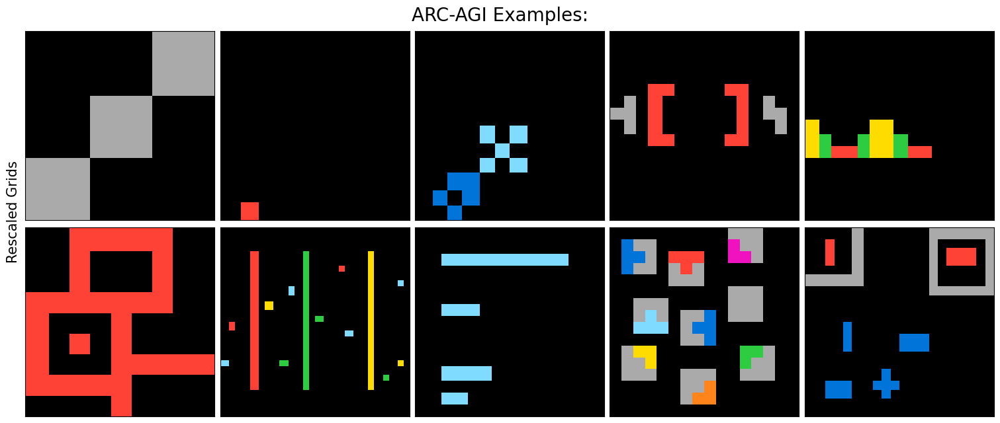

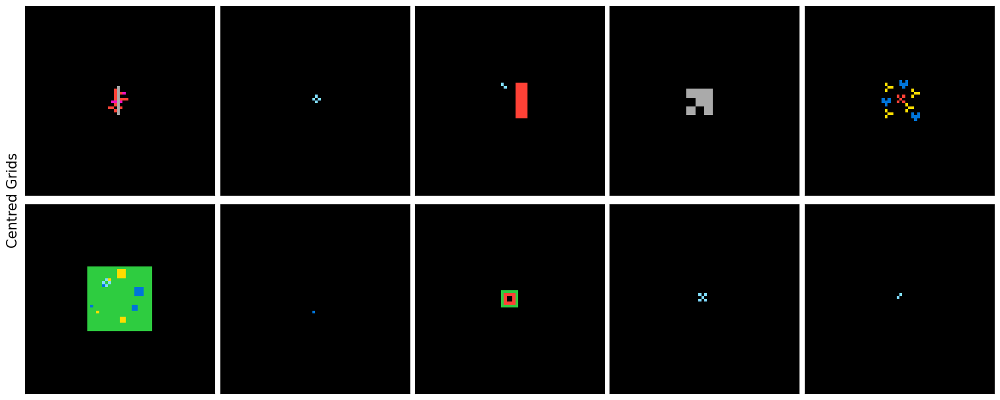

In [4]:
# Display some sample training images from the MultiDSprites dataset
# Load up dataset
dataset = MultiDSprites(
    "datasets",
    version="colored_on_colored",
    split="Train",
    download=False,
    convert=False,
)
images = (dataset[:10]["image"] / 255)
# Construct figure to display images with proper formatting
fig, axes = plt.subplots(2, 5, figsize=(15, 6.3), layout="constrained")
fig.suptitle("MultiDSprites Examples:", fontsize=20)
fig.supylabel("Coloured (In-Distribution)", fontsize=15)
for i in range(10):
    axes[i // 5, i % 5].imshow(images[i].permute(1, 2, 0))
    axes[i // 5, i % 5].set_xticks([])
    axes[i // 5, i % 5].set_xticklabels([])
    axes[i // 5, i % 5].set_yticks([])
    axes[i // 5, i % 5].set_yticklabels([])
    axes[i // 5, i % 5].set_aspect("equal")
plt.show()
# Load up dataset
dataset = MultiDSprites(
    "datasets",
    version="colored_on_grayscale",
    split="Train",
    download=False,
    convert=False,
)
images = (dataset[:10]["image"] / 255)
# Construct figure to display images with proper formatting
fig, axes = plt.subplots(2, 5, figsize=(15, 6), layout="constrained")
fig.supylabel("Grayscale", fontsize=15)
for i in range(10):
    axes[i // 5, i % 5].imshow(images[i].permute(1, 2, 0))
    axes[i // 5, i % 5].set_xticks([])
    axes[i // 5, i % 5].set_xticklabels([])
    axes[i // 5, i % 5].set_yticks([])
    axes[i // 5, i % 5].set_yticklabels([])
    axes[i // 5, i % 5].set_aspect("equal")
plt.show()

# Display some sample training images from the ObjectsRoom dataset
# Load up dataset
dataset = ObjectsRoom(
    "datasets",
    split="Train",
    download=False,
    convert=False,
)
images = (dataset[:10]["image"] / 255)
# Construct figure to display images with proper formatting
fig, axes = plt.subplots(2, 5, figsize=(15, 6.3), layout="constrained")
fig.suptitle("ObjectsRoom Examples:", fontsize=20)
fig.supylabel("In-Distribution", fontsize=15)
for i in range(10):
    axes[i // 5, i % 5].imshow(images[i].permute(1, 2, 0))
    axes[i // 5, i % 5].set_xticks([])
    axes[i // 5, i % 5].set_xticklabels([])
    axes[i // 5, i % 5].set_yticks([])
    axes[i // 5, i % 5].set_yticklabels([])
    axes[i // 5, i % 5].set_aspect("equal")
plt.show()
# Load up dataset
dataset = ObjectsRoom(
    "datasets",
    split="empty_room",
    download=False,
    convert=False,
)
images = (dataset[920:]["image"] / 255)
# Load up dataset
dataset = ObjectsRoom(
    "datasets",
    split="identical_color",
    download=False,
    convert=False,
)
images = torch.cat((images, dataset[918:]["image"] / 255), dim=0)
# Load up dataset
dataset = ObjectsRoom(
    "datasets",
    split="six_objects",
    download=False,
    convert=False,
)
images = torch.cat((images, dataset[918:]["image"] / 255), dim=0)
# Construct figure to display images with proper formatting
fig, axes = plt.subplots(2, 5, figsize=(15, 6), layout="constrained")
fig.supylabel("Out-of-Distribution", fontsize=15)
for i in range(10):
    axes[i // 5, i % 5].imshow(images[i].permute(1, 2, 0))
    axes[i // 5, i % 5].set_xticks([])
    axes[i // 5, i % 5].set_xticklabels([])
    axes[i // 5, i % 5].set_yticks([])
    axes[i // 5, i % 5].set_yticklabels([])
    axes[i // 5, i % 5].set_aspect("equal")
plt.show()

# Display some sample training images from the ARCAGI dataset
# Load up dataset
dataset = ARCAGI(
    "datasets",
    version="zoomed",
    split="Train",
)
images = [dataset[i]["image"] / 255 for i in [0, 100, 200, 300, 400, 500, 600, 700, 800, 900]]
# Construct figure to display images with proper formatting
fig, axes = plt.subplots(2, 5, figsize=(15, 6.3), layout="constrained")
fig.suptitle("ARC-AGI Examples:", fontsize=20)
fig.supylabel("Rescaled Grids", fontsize=15)
for i in range(10):
    axes[i // 5, i % 5].imshow(images[i].permute(1, 2, 0))
    axes[i // 5, i % 5].set_xticks([])
    axes[i // 5, i % 5].set_xticklabels([])
    axes[i // 5, i % 5].set_yticks([])
    axes[i // 5, i % 5].set_yticklabels([])
    axes[i // 5, i % 5].set_aspect("equal")
plt.show()
# Load up dataset
dataset = ARCAGI(
    "datasets",
    version="centred",
    split="Train",
)
images = [dataset[i]["image"] / 255 for i in [1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900]]
# Construct figure to display images with proper formatting
fig, axes = plt.subplots(2, 5, figsize=(15, 6), layout="constrained")
fig.supylabel("Centred Grids", fontsize=15)
for i in range(10):
    axes[i // 5, i % 5].imshow(images[i].permute(1, 2, 0))
    axes[i // 5, i % 5].set_xticks([])
    axes[i // 5, i % 5].set_xticklabels([])
    axes[i // 5, i % 5].set_yticks([])
    axes[i // 5, i % 5].set_yticklabels([])
    axes[i // 5, i % 5].set_aspect("equal")
plt.show()


## Models

### Model Versions

#### Original Version

This version of the model represents our most faithful reconstruction of the original model presented in our selected paper. For a breakdown of how our reimplementation of the model works, see the `monet.ipynb` file contained within this repository.

#### NoRMask Version

This version of the model is our own modification/extension that removes the mask reconstruction step from the VAE and the corresponding term in the loss function. The inspiration for this version was the observation that the reconstructed masks tend to be poor (they appear as overly blurred versions of the attention-generated masks) are not actually required for inference of the model -- in the original paper, overall image reconstructions use the attention-generated masks (and never their reconstructions). By removing this step, the model becomes slightly smaller (fewer parameters are needed as the output generated by the VAE becomes smaller) and training becomes simpler and slightly faster (one term of the loss function disappears, leaving a simpler expression graph to backpropagate through). For a full breakdown, see the `monet_normask.ipynb` file contained within this repository.

#### Mini Version

This version of the model is our own modification/extension that is significantly smaller and faster. This version is used for smaller images (32$\times$32 pixels, as opposed to the default 64$\times$64). The inspiration for this version was the excessive computational demands to train and inference the original model and the fact that grids in the application domain of `ARC-AGI` are at most 30$\times$30 in size. By reducing input and output size, the model requires fewer trainable parameters; in additon, smaller images means that the very deep neural networks used in the model can be reduced in size as well. We removed one layer from each of the VAE encoder and decoder as well as the down- and up-sampling paths of the U-Net in the attention network. The resulting miniature model was roughly one-quarter the size of the original model. For a full breakdown, see the `monet_mini.ipynb` file contained within this repository.


## Results

### Implementation Details

Unfortunately, due to the extreme computational resources required to train the model, we were not able to perform thorough hyperparameter tuning experiments and train as many versions of the model as desired. We present six main versions of the model:

* `MONet_MultiDSprites`
* `MONet_ObjectsRoom`
* `MONet_NoRMask_MultiDSprites`
* `MONet_NoRMask_ObjectsRoom`
* `MONet_Mini_MultiDSprites`
* `MONet_Mini_ObjectsRoom`

All models use 5 attention slots (additional slots require substantial additional training time). Each model was trained on batches of size 128 (different from the batch size of 64 used in the original paper, but optimized for speed on our hardware). Generally, the models were trained for 1000 epochs (meaning the models were trained for 703,125 iterations, as opposed to the 1,000,000 training iterations used in the original paper).

### Performance

#### MultiDSprites

Overall, performance on the `MultiDSprites` dataset was strong. Given that the images are of two-dimensional, solid-colour objects, strong performance is not surprising. Models were trained on only the coloured version of the dataset. Models exhibit strong generalization to unseen testing data (even out-of-distribution testing data). The grayscale version of the dataset contains an additional objects, meaning that the model may not be able to assign each object its own slot; in these cases, the model generally seemed to choose to combine the two objects that appear most similar, which is a good result.

#### ObjectsRoom

Overall, performance on the `ObjectsRoom` dataset was weaker, but still strong. This makes sense; images are three-dimensional and contain more complex shapes, so weaker performance is to be expected. Additionally, models exhibited strong performance on withheld testing data, although performance falters on the three out-of-distribution testing datasets. The model generally responds well to an empty room (no imaginary objects are segmented), has minor struggles with many objects of the same colour (especially when they are in close proiximity), and has major struggles with many additional objects (primarily because there are simply not enough slots within the model to properly isolate each object).

#### NoRMask

Overall, this version of the model performs similarly to the original version, but is slightly smaller and trains slightly faster. The main apparent difference is that this version of the model tends to produce more complex masks. This is because the reconstructed masks must be generated based on some Gaussian latent vector (because they are generated by a VAE), so they tend to be simple, blob-like shapes. The original loss function contains a term that drives the attention-generated mask distribution to match the distributed created by these reconstructed masks (via Kullback-Leibler divergence). Thus, as part of the model's complex optimization goal, it is driven generate attention masks that are easy to reconstruct and, therefore, simple. This performance difference is subtle for simple images, such as those in the `MultiDSprites` dataset, but becomes apparent for more complex images, such as those in the `ObjectsRoom` dataset.

#### Mini

Overall, this version of the model also performs similarly to the original version, but is even smaller and trains even faster. Performance certainly degrades, but much of this downgrade may be attributable to the deterioration in the quality of the training and testing data. The objects to be segmented become very small (especially in the `ObjectsRoom` dataset), which causes the model to sometimes bypass segmenting them entirely, trading the now-relatively-small penalty in the loss for failing to reconstruct these objects (the first loss term) for the penalty for model complexity (the second and third loss terms). Various tinkering was undertaken to arrive at the model architecture chosen, which contains roughly one-quarter of the parameters of the original model while maintaining some level of strong performance.



MONet_MultiDSprites on Coloured Testing Data:

Sample #1:


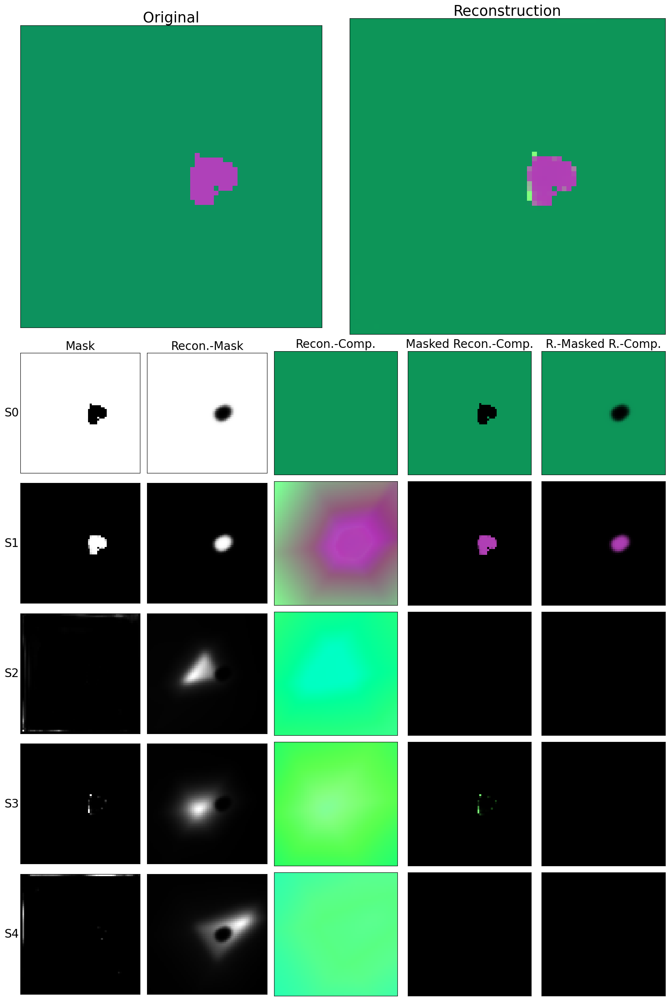

Sample #2:


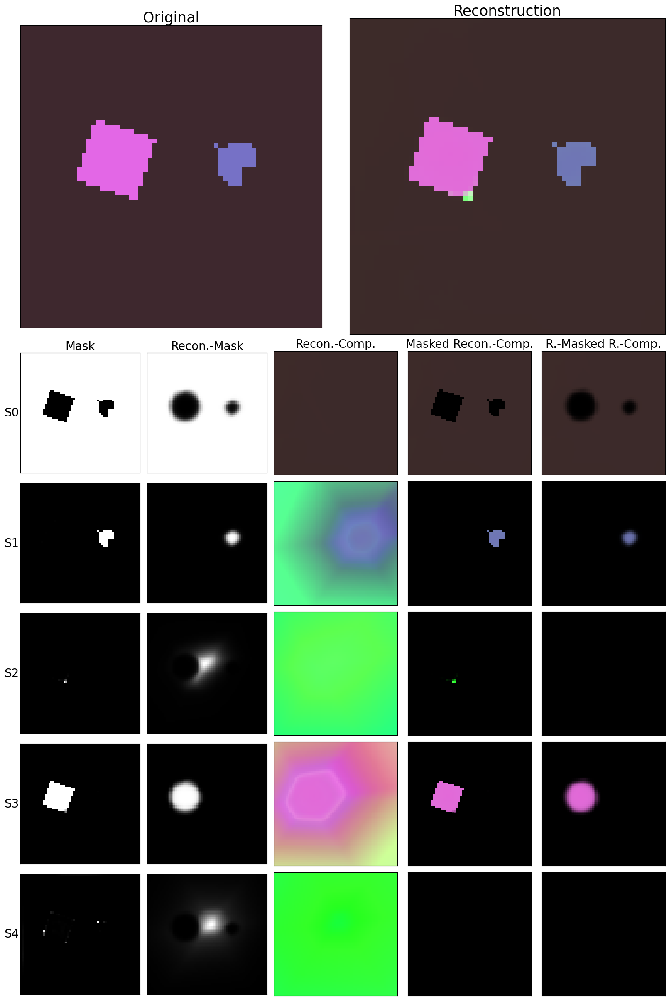

Sample #3:


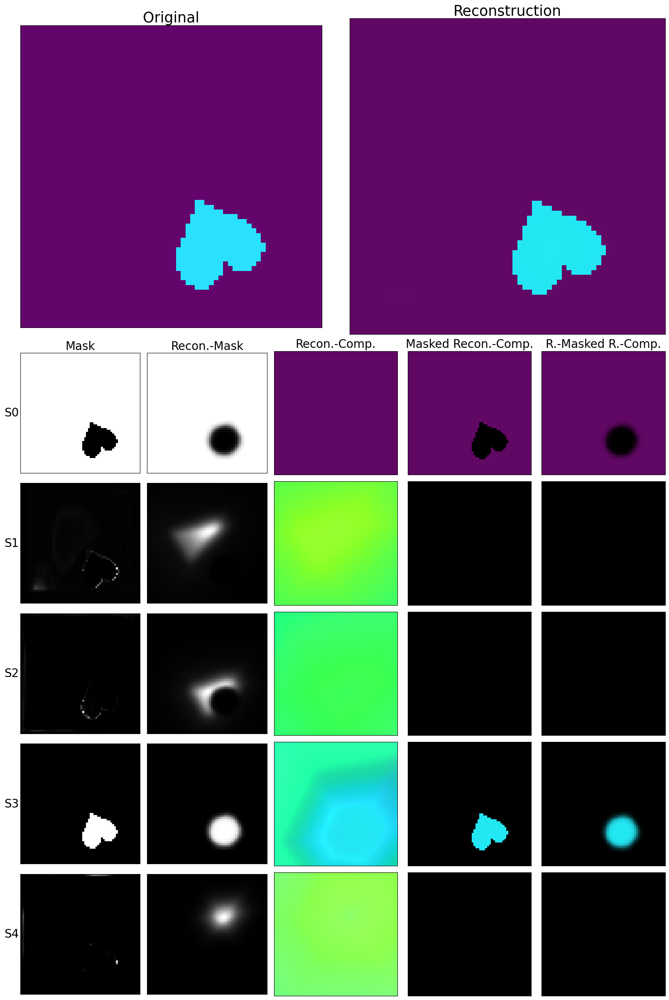

Sample #4:


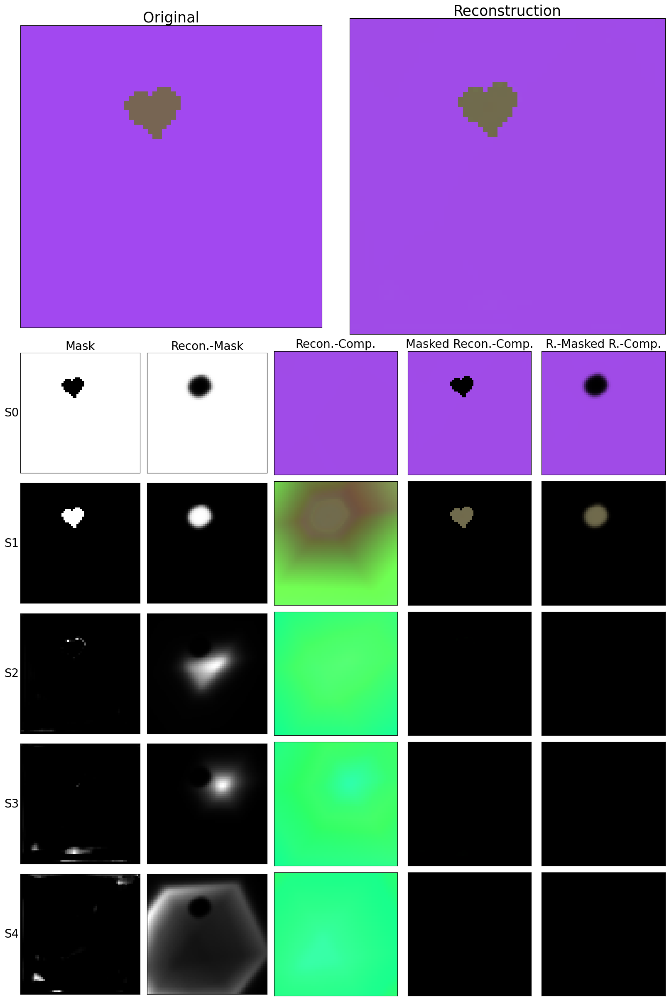

Average MSE Score: 0.00042

MONet_MultiDSprites on Grayscale Testing Data:

Sample #1:


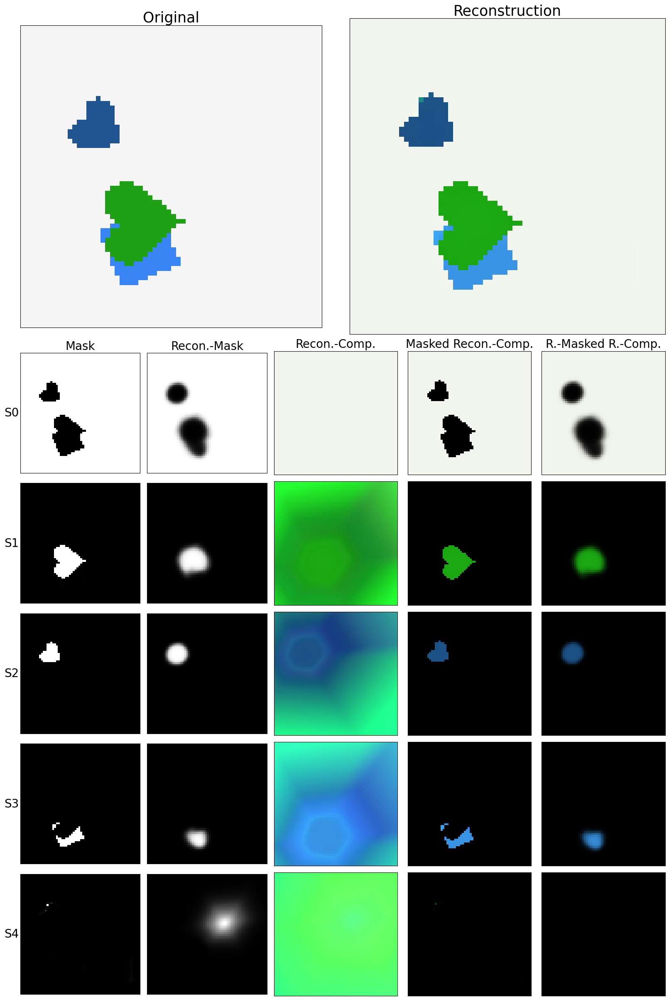

Sample #2:


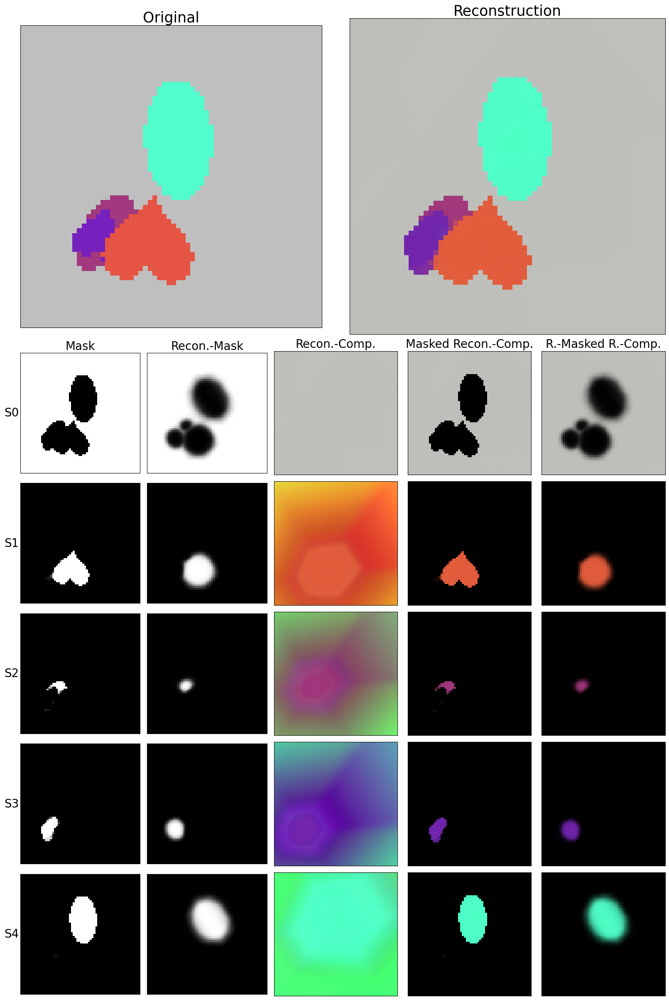

Sample #3:


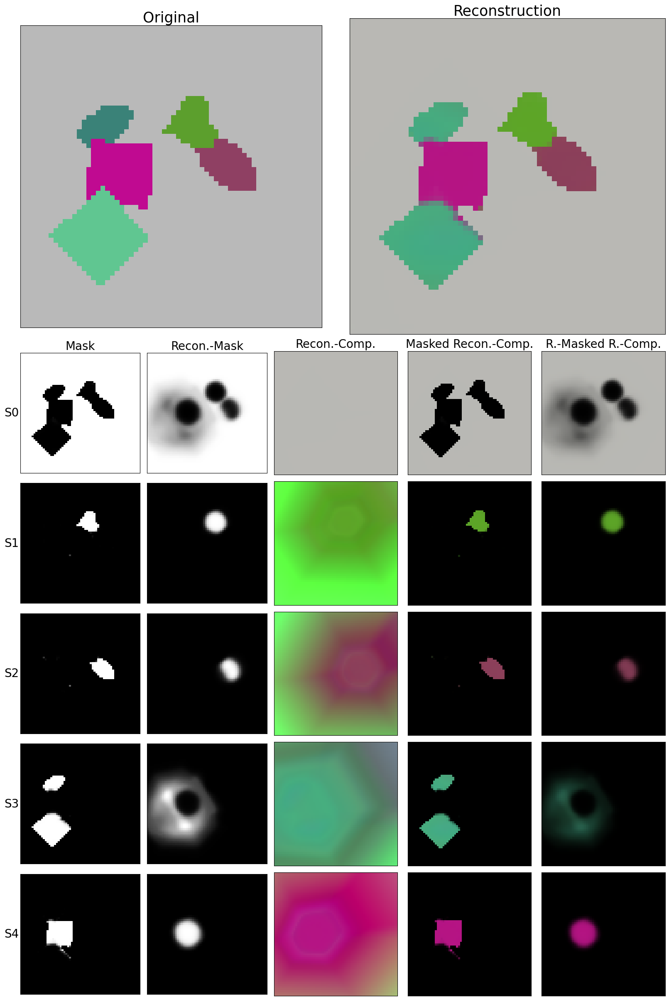

Sample #4:


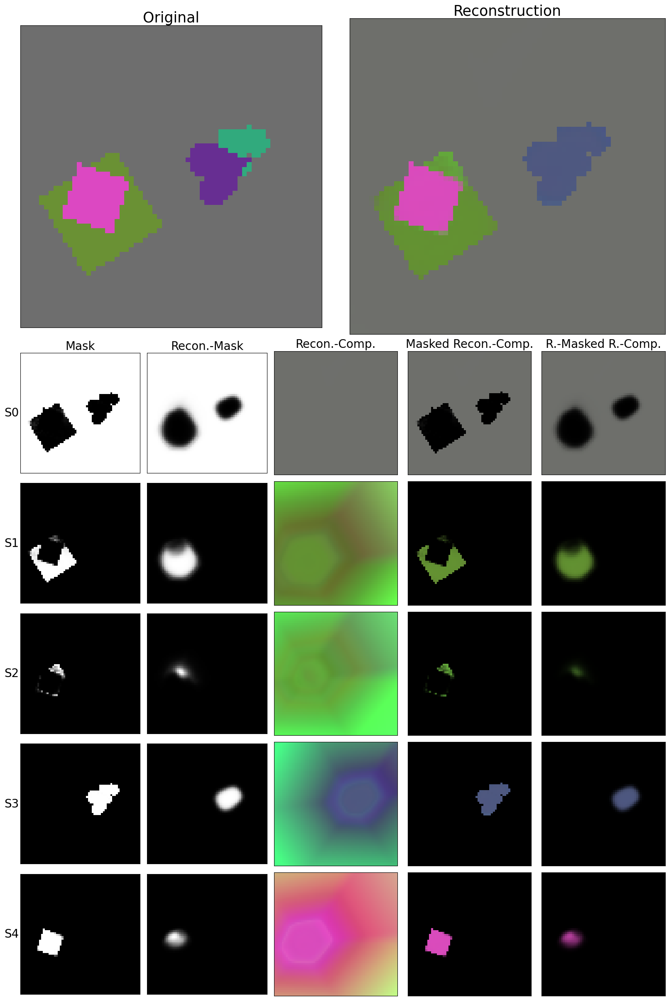

Average MSE Score: 0.00078


In [5]:
# This 5-slot model was trained in batches of 128 images (of 90,000) for 300 epochs with a learning rate of 0.0001

name = "MONet_MultiDSprites"

# Load original model trained on MultiDSprites
model = monet.MONet(5, 128, 0)
model.load_state_dict(
    torch.load(
        f"models/{name}.pt",
        weights_only=False,
        map_location=torch.device(device),
    )
)
model.eval()

# Load sample testing data
dataset = MultiDSprites(
    "datasets",
    version="colored_on_colored",
    split="Test",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Coloured Testing Data:\n")
show_n_examples(4, model, images)
base_mds_coloured_mse = show_metrics(model, dataset)

# Load sample testing data
dataset = MultiDSprites(
    "datasets",
    version="colored_on_grayscale",
    split="Test",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Grayscale Testing Data:\n")
show_n_examples(4, model, images)
base_mds_grayscale_mse = show_metrics(model, dataset)



MONet_ObjectsRoom on Testing Data:

Sample #1:


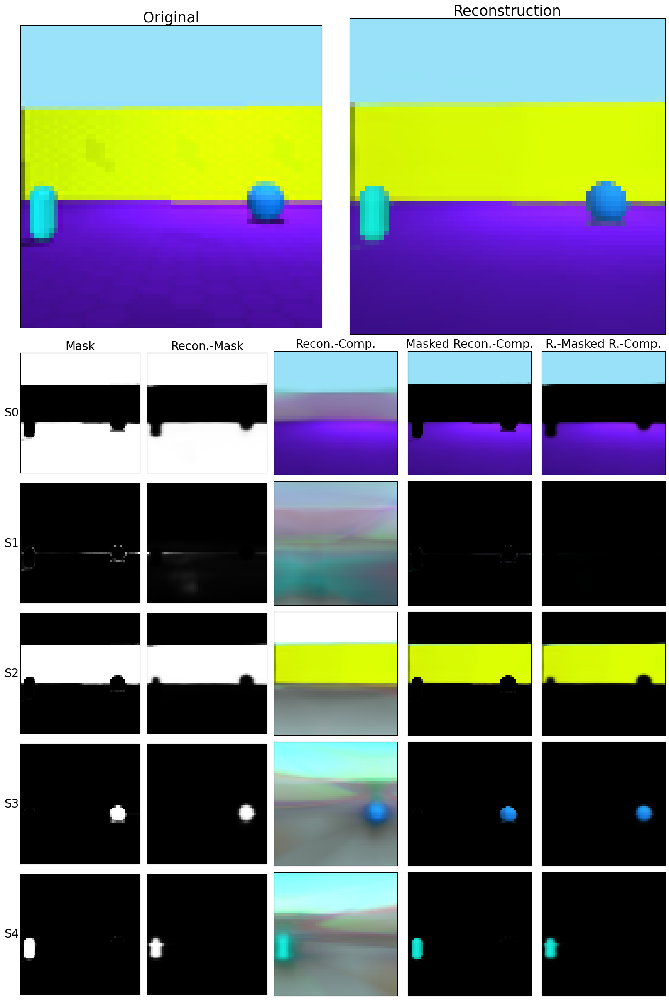

Sample #2:


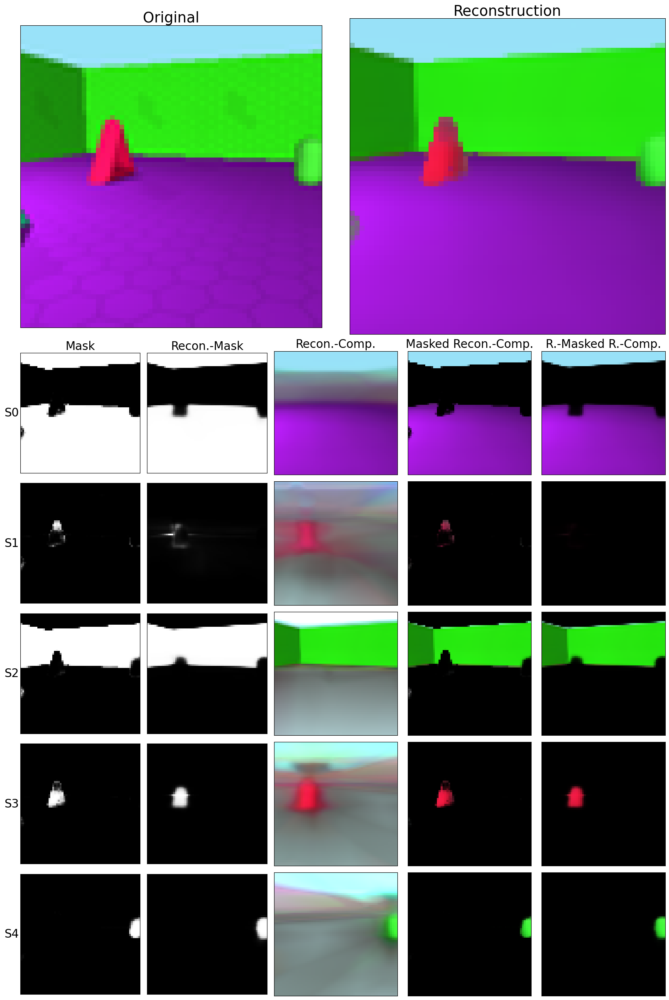

Sample #3:


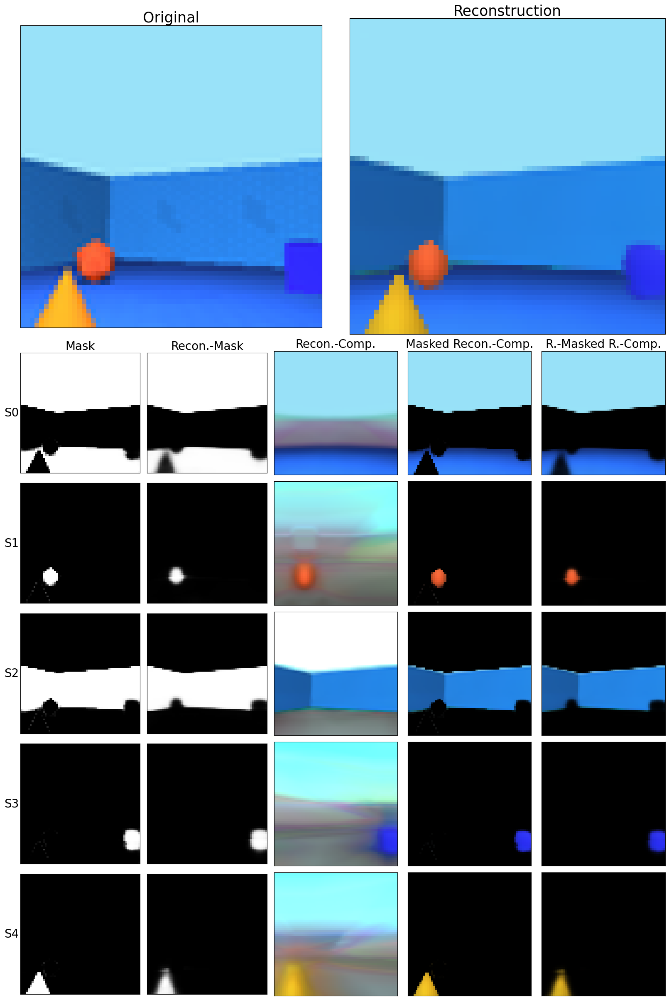

Sample #4:


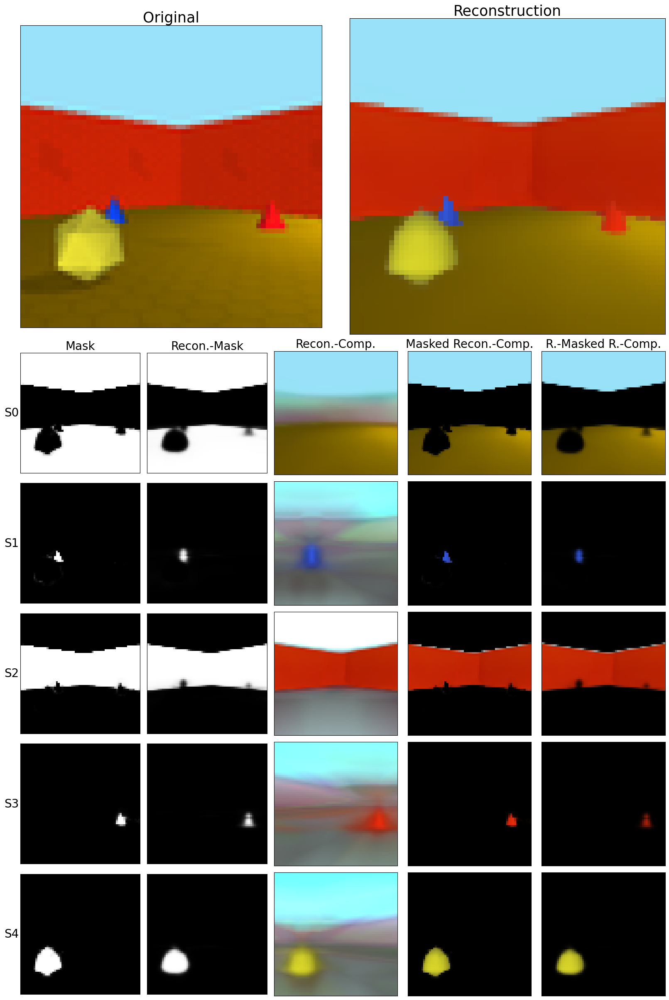

Sample #5:


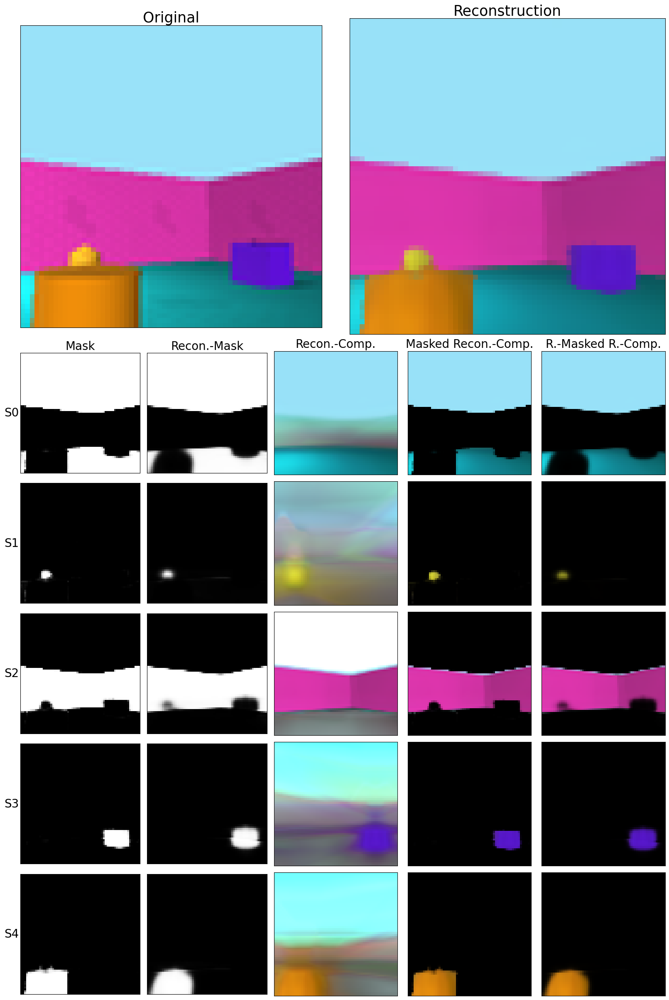

Sample #6:


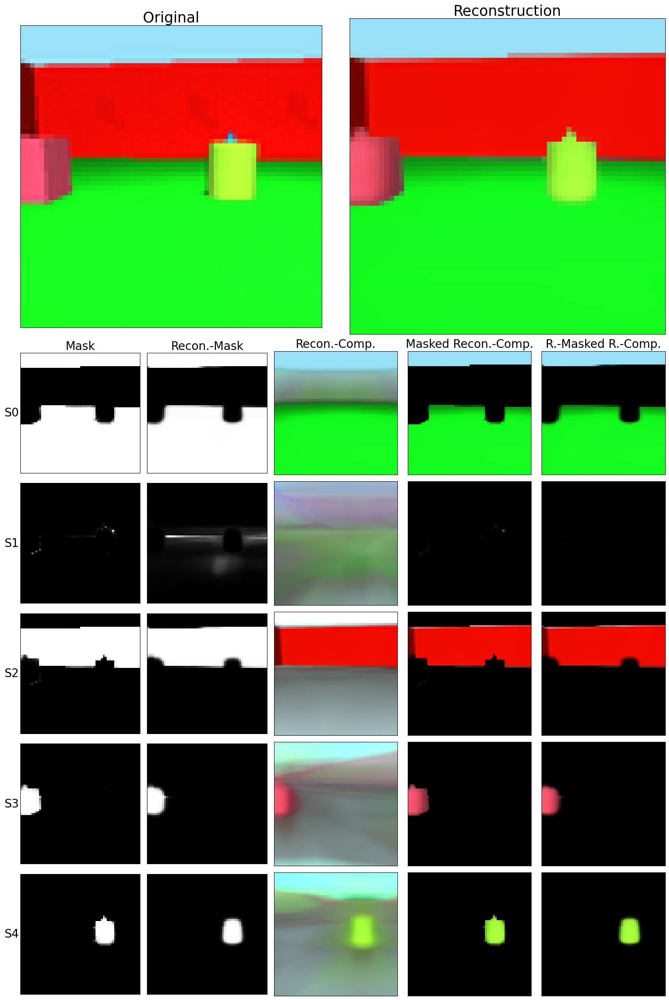

Average MSE Score: 0.00119
INFO: 'empty_room' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.

MONet_ObjectsRoom on Out-of-Distribution (Empty Room) Testing Data:

Sample #1:


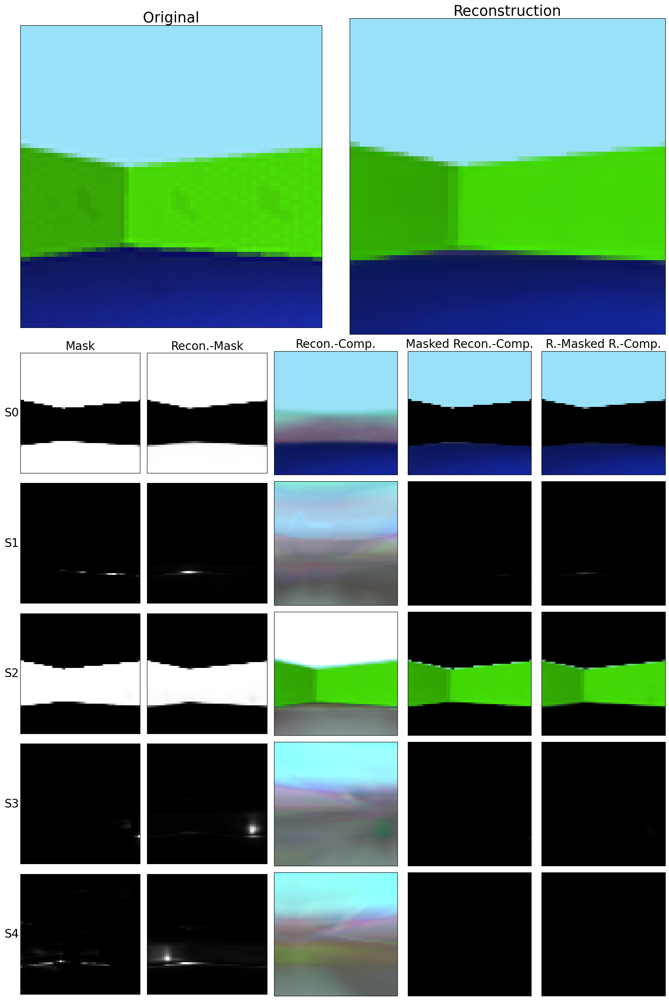

Sample #2:


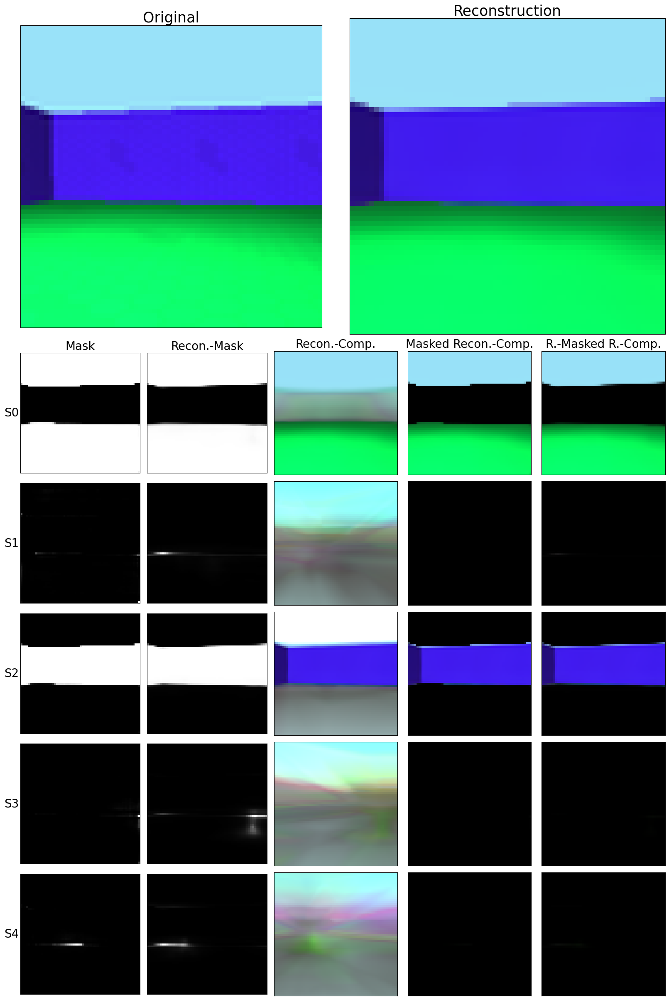

Average MSE Score: 0.00046
INFO: 'identical_color' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.

MONet_ObjectsRoom on Out-of-Distribution (Objects of Identical Colour) Testing Data:

Sample #1:


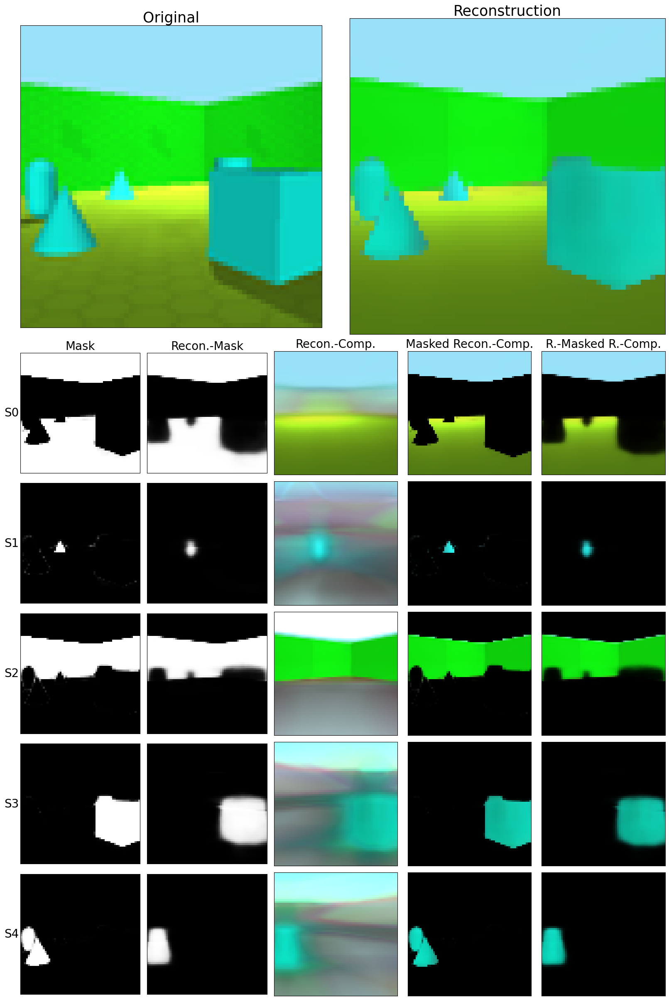

Sample #2:


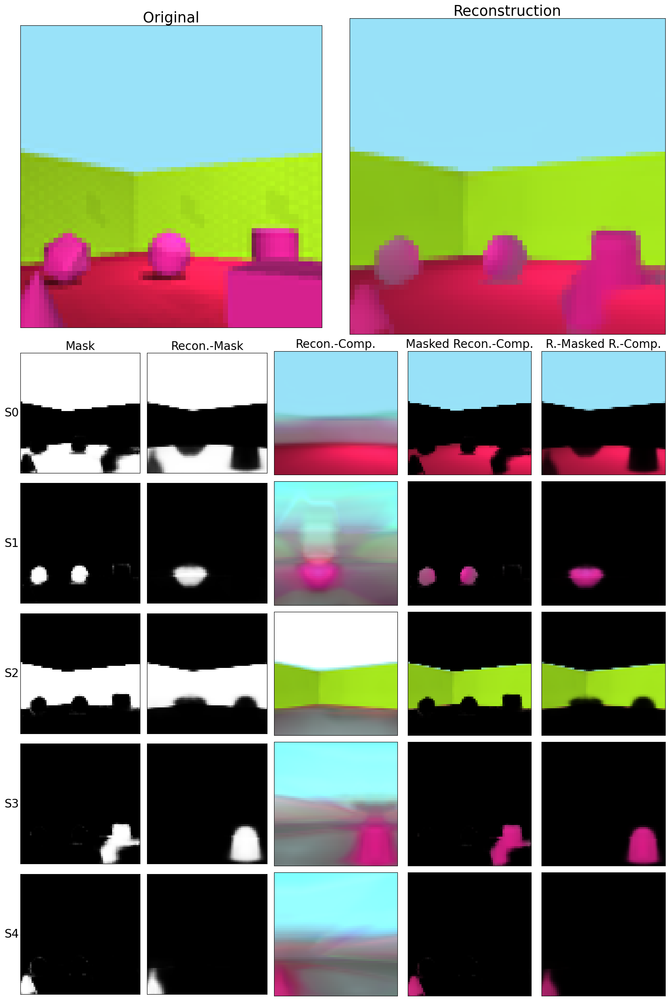

Average MSE Score: 0.00733
INFO: 'six_objects' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.

MONet_ObjectsRoom on Out-of-Distribution (Six Objects) Testing Data:

Sample #1:


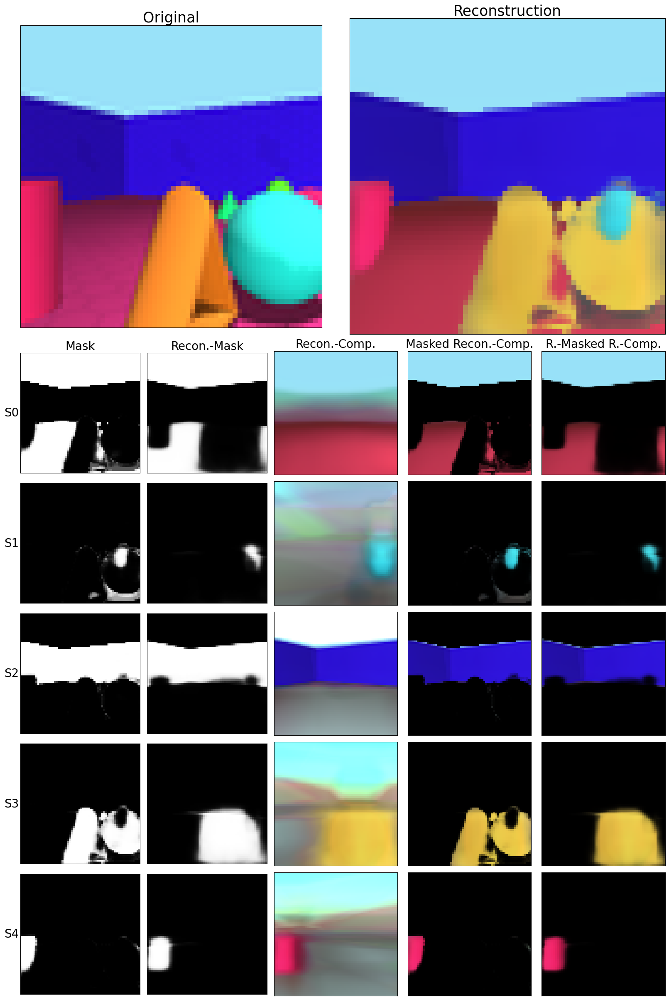

Sample #2:


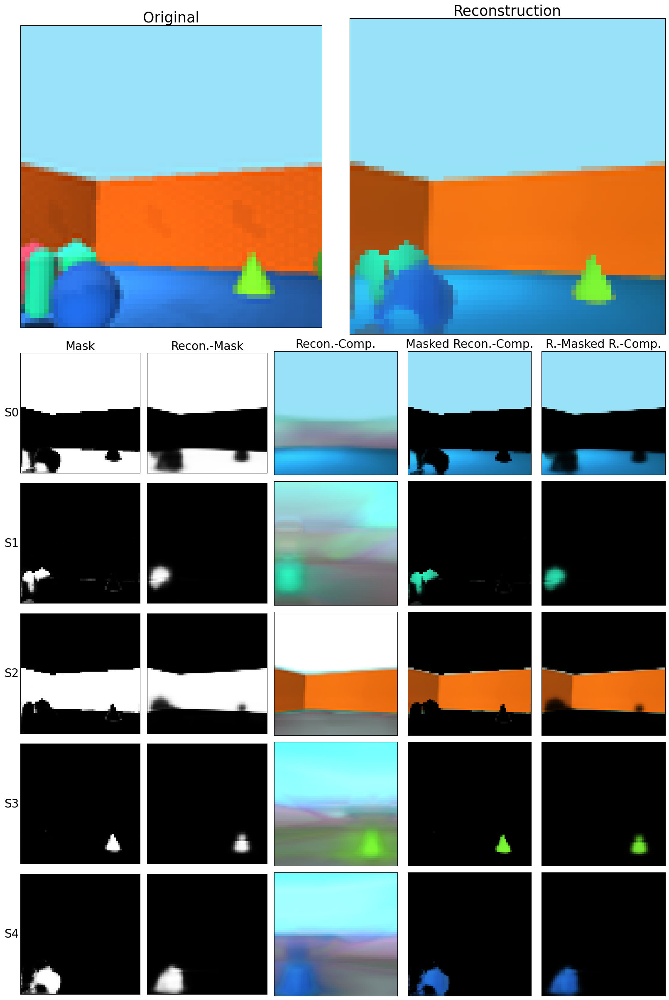

Average MSE Score: 0.00728


In [6]:
# This 5-slot model was trained in batches of 128 images (of 90,000) for 500 epochs with a learning rate of 0.0001

name = "MONet_ObjectsRoom"

# Load original model trained on ObjectsRoom
model = monet.MONet(5, 128, 0)
model.load_state_dict(
    torch.load(
        f"models/{name}.pt",
        weights_only=False,
        map_location=torch.device(device),
    )
)
model.eval()

# Load sample testing data
dataset = ObjectsRoom(
    "datasets",
    split="Test",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Testing Data:\n")
show_n_examples(6, model, images)
base_or_indist_mse = show_metrics(model, dataset)

# Load sample out-of-distribution testing data
dataset = ObjectsRoom(
    "datasets",
    split="empty_room",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Out-of-Distribution (Empty Room) Testing Data:\n")
show_n_examples(2, model, images)
base_or_emptyroom_mse = show_metrics(model, dataset)

# Load sample out-of-distribution testing data
dataset = ObjectsRoom(
    "datasets",
    split="identical_color",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Out-of-Distribution (Objects of Identical Colour) Testing Data:\n")
show_n_examples(2, model, images)
base_or_idencol_mse = show_metrics(model, dataset)

# Load sample out-of-distribution testing data
dataset = ObjectsRoom(
    "datasets",
    split="six_objects",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Out-of-Distribution (Six Objects) Testing Data:\n")
show_n_examples(2, model, images)
base_or_sixobj_mse = show_metrics(model, dataset)



MONet_NoRMask_MultiDSprites on Coloured Testing Data:

Sample #1:


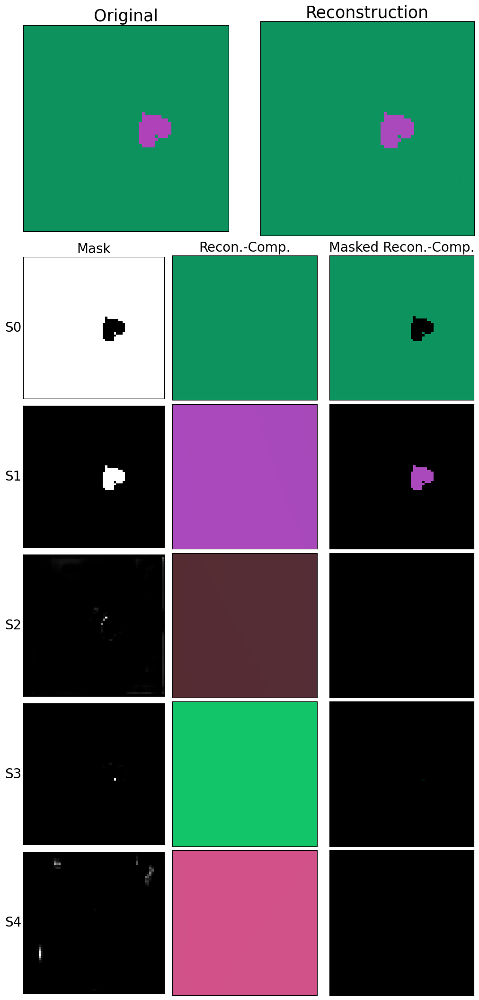

Sample #2:


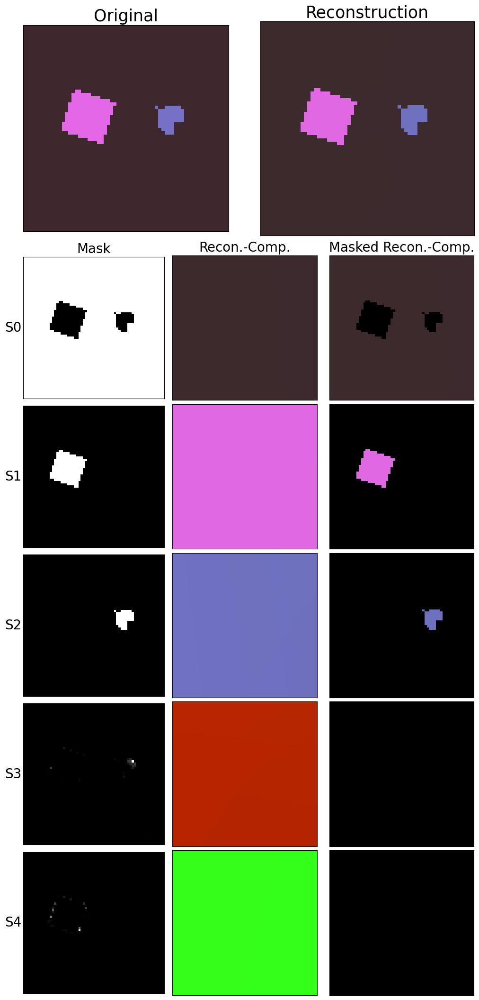

Sample #3:


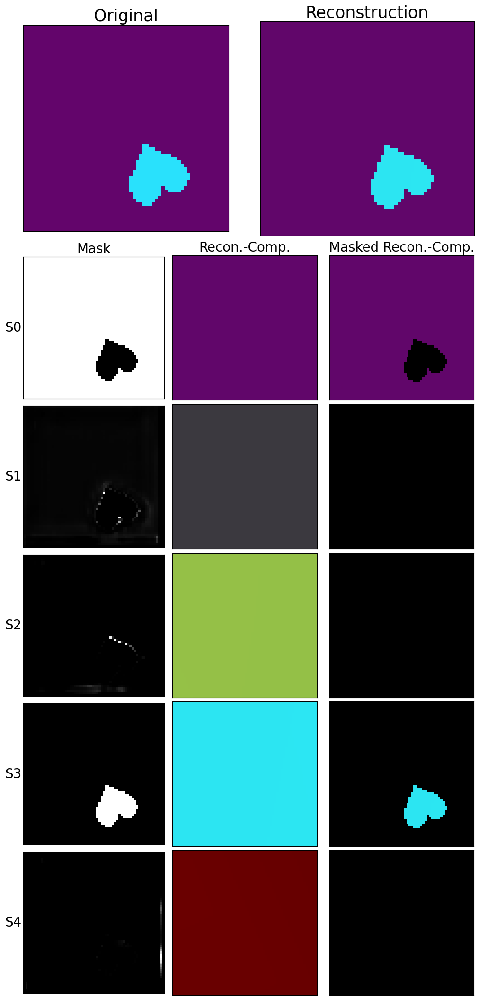

Sample #4:


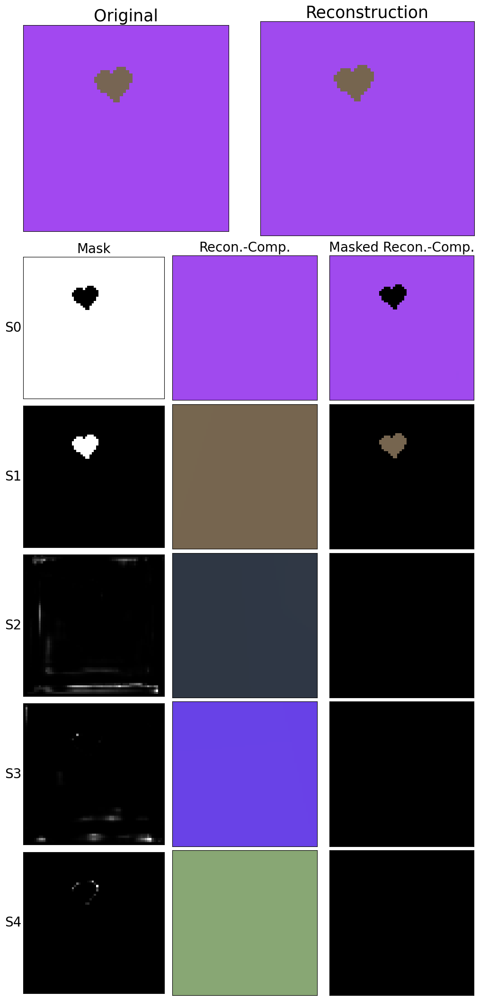

Average MSE Score: 0.00013

MONet_NoRMask_MultiDSprites on Grayscale Testing Data:

Sample #1:


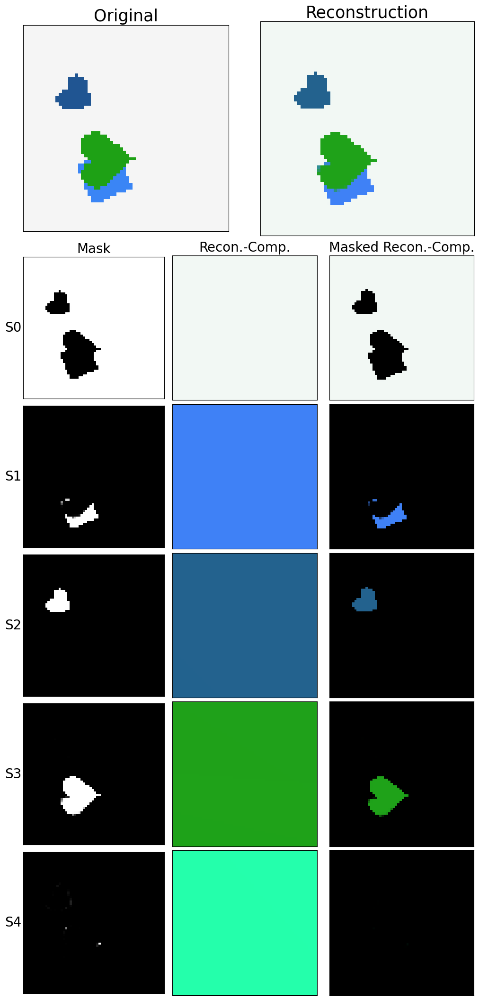

Sample #2:


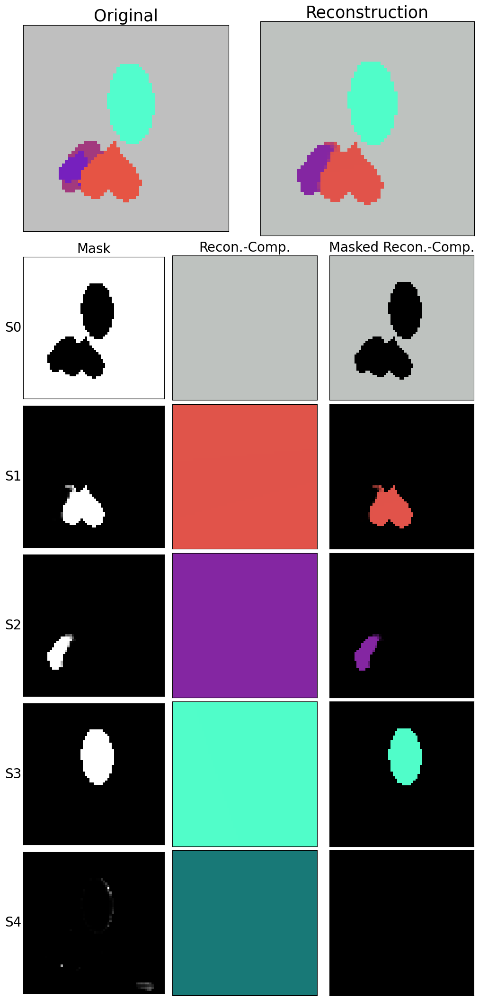

Sample #3:


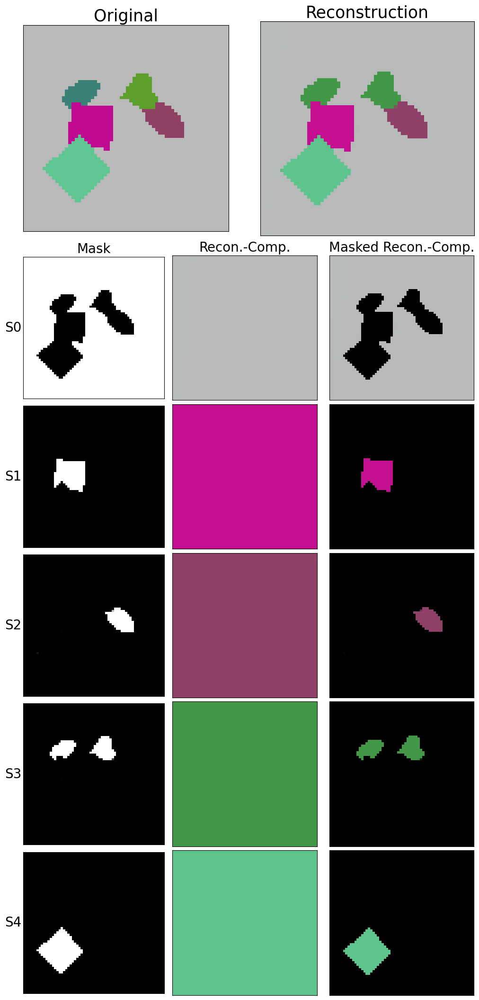

Sample #4:


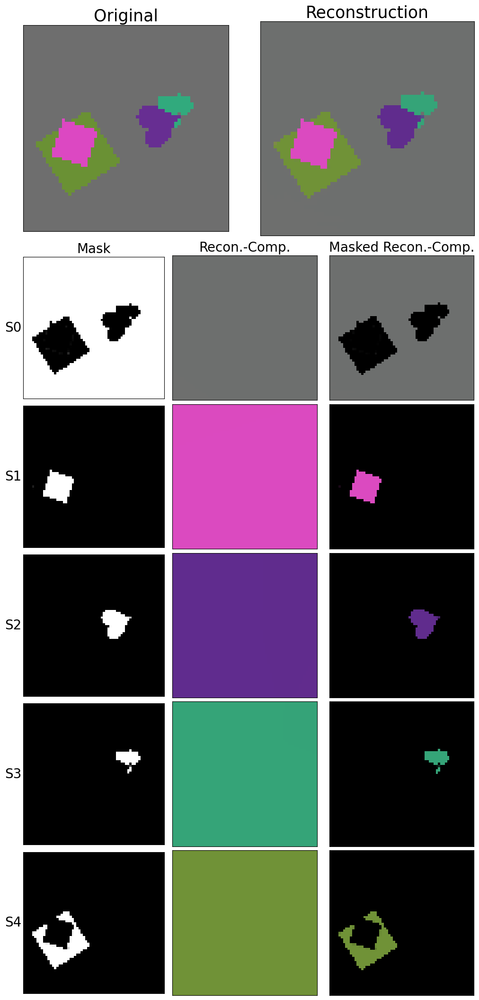

Average MSE Score: 0.00041


In [7]:
# This 5-slot model was trained in batches of 128 images (of 180,000) for 1000 epochs with a learning rate of 0.0001

name = "MONet_NoRMask_MultiDSprites"

# Load NoRMask model trained on MultiDSprites
model = monet_normask.MONet_NoRMask(5, 128, 0)
model.load_state_dict(
    torch.load(
        f"models/{name}.pt",
        weights_only=False,
        map_location=torch.device(device),
    )
)
model.eval()

# Load sample testing data
dataset = MultiDSprites(
    "datasets",
    version="colored_on_colored",
    split="Test",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Coloured Testing Data:\n")
show_n_examples_normask(4, model, images)
normask_mds_coloured_mse = show_metrics_normask(model, dataset)

# Load sample testing data
dataset = MultiDSprites(
    "datasets",
    version="colored_on_grayscale",
    split="Test",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Grayscale Testing Data:\n")
show_n_examples_normask(4, model, images)
normask_mds_grayscale_mse = show_metrics_normask(model, dataset)



MONet_NoRMask_ObjectsRoom on Testing Data:

Sample #1:


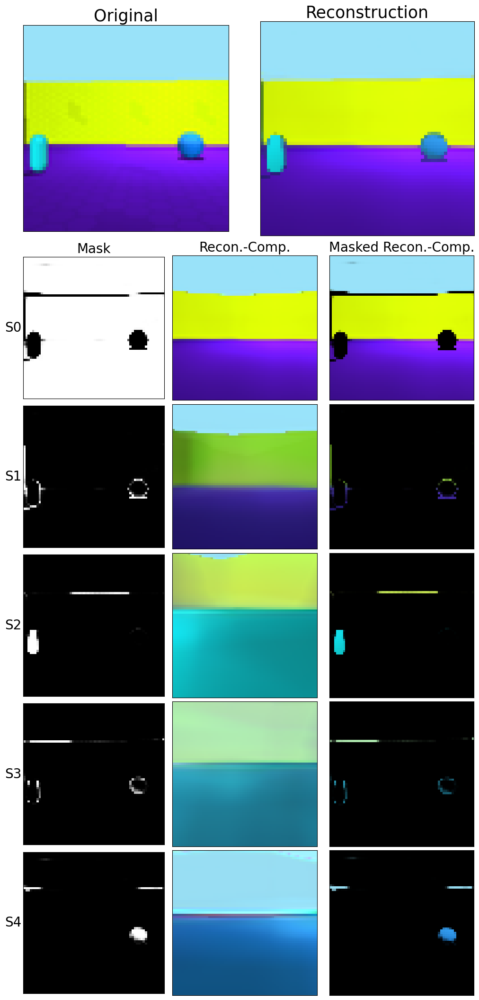

Sample #2:


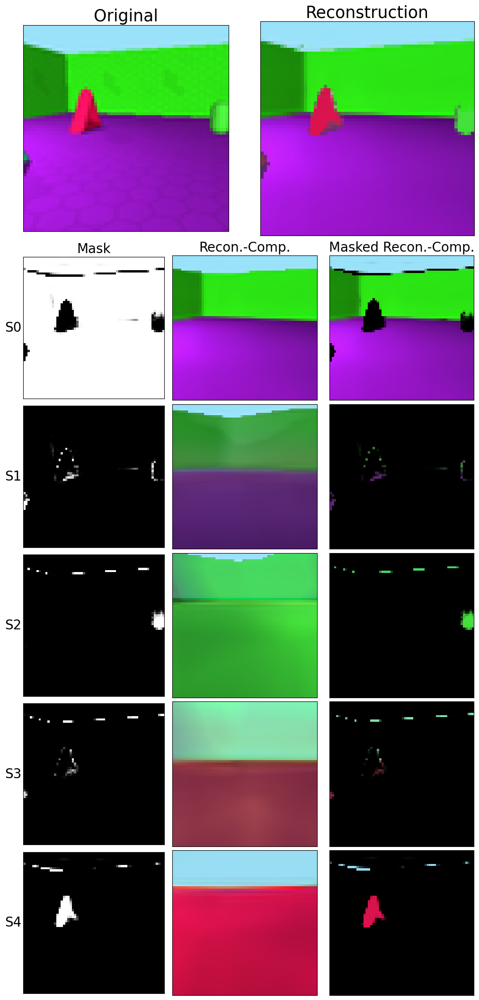

Sample #3:


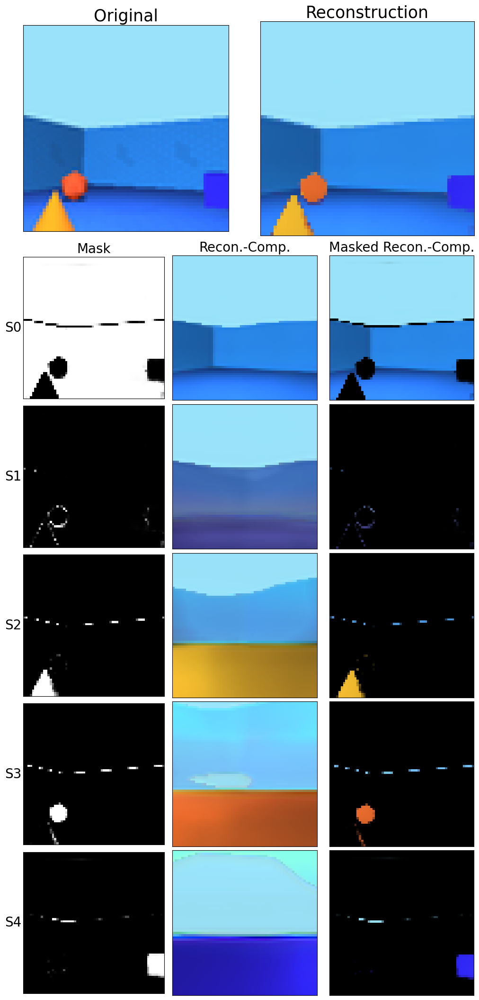

Sample #4:


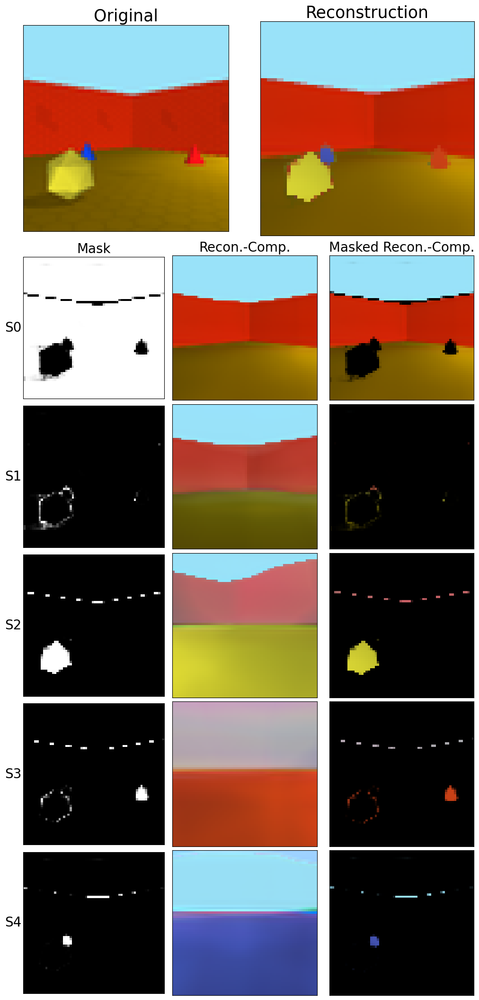

Sample #5:


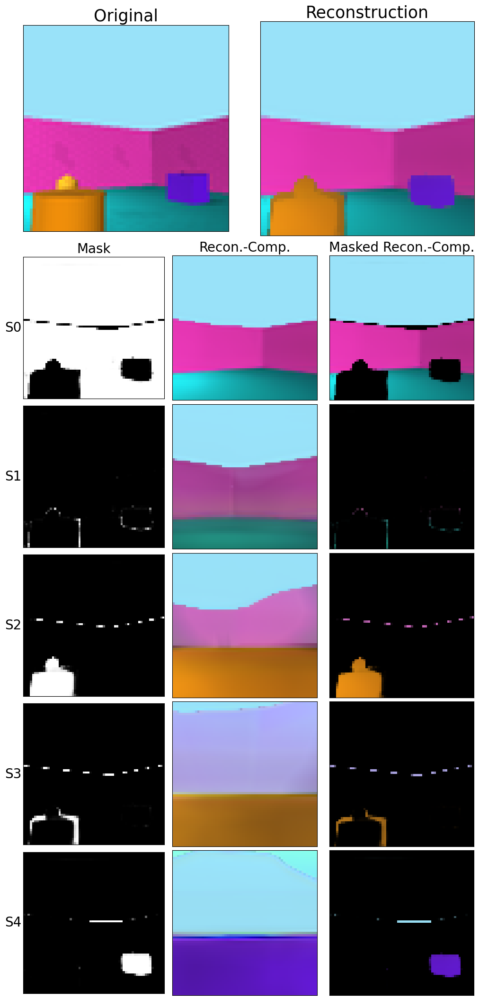

Sample #6:


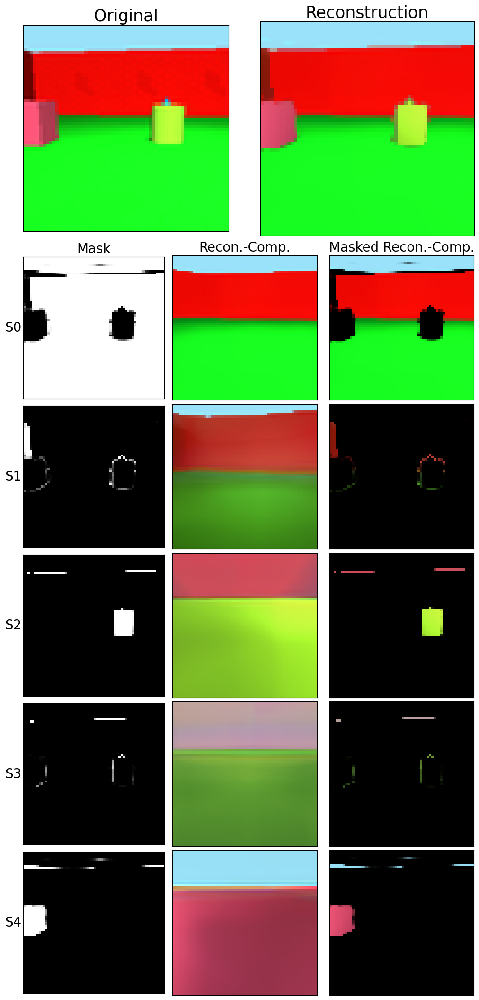

Average MSE Score: 0.00098
INFO: 'empty_room' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.

MONet_NoRMask_ObjectsRoom on Out-of-Distribution (Empty Room) Testing Data:

Sample #1:


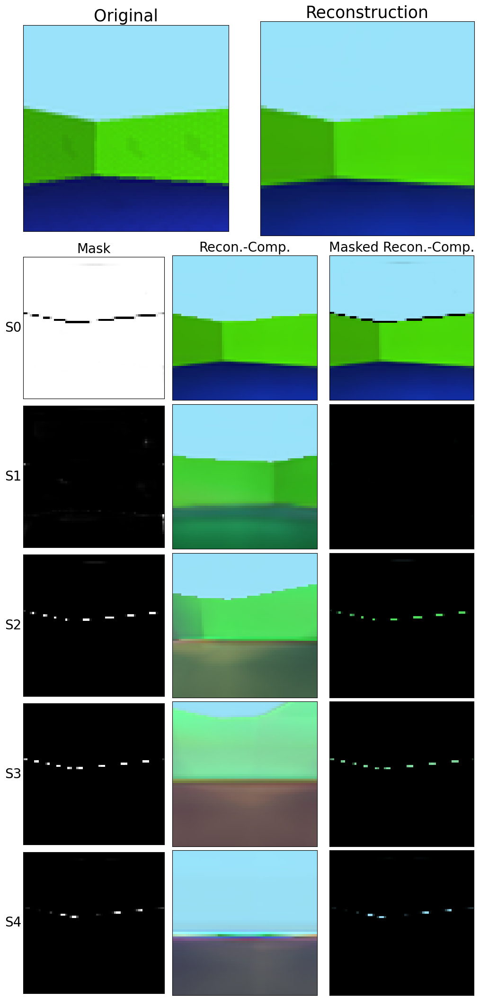

Sample #2:


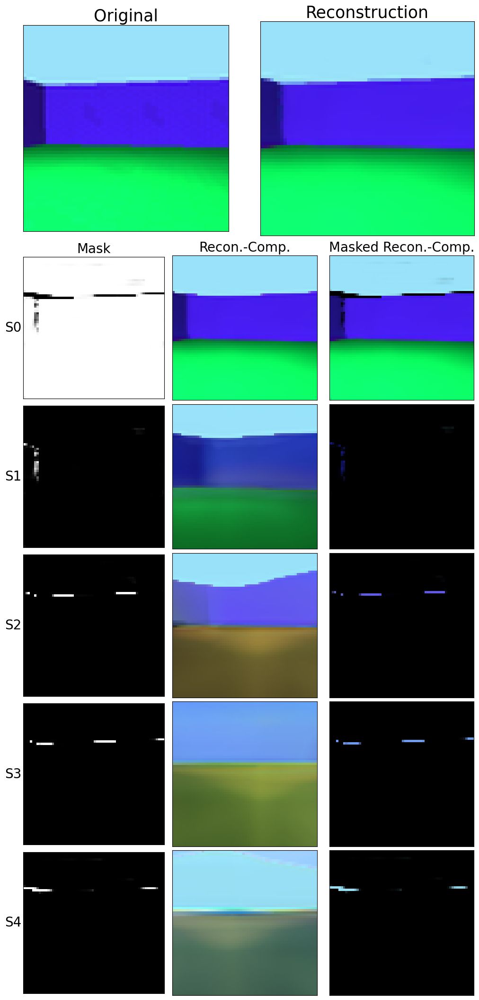

Average MSE Score: 0.00032
INFO: 'identical_color' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.

MONet_NoRMask_ObjectsRoom on Out-of-Distribution (Objects of Identical Colour) Testing Data:

Sample #1:


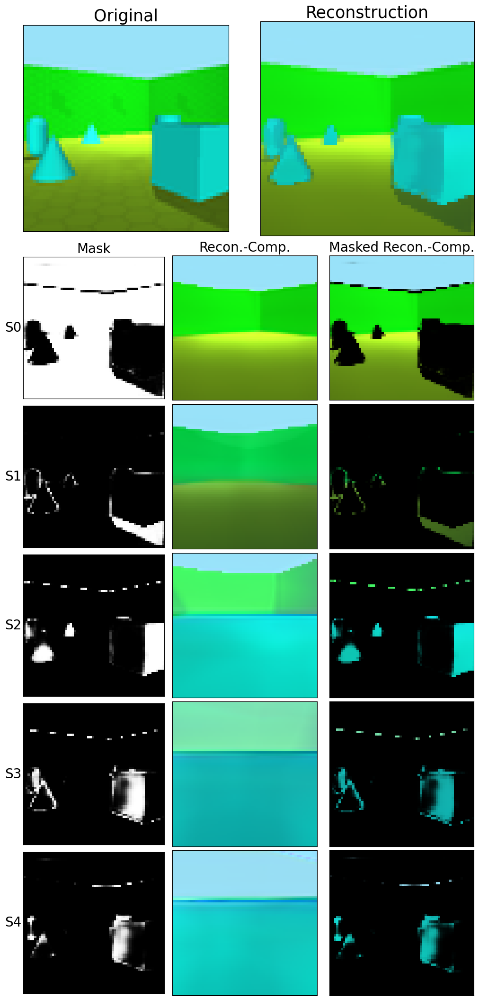

Sample #2:


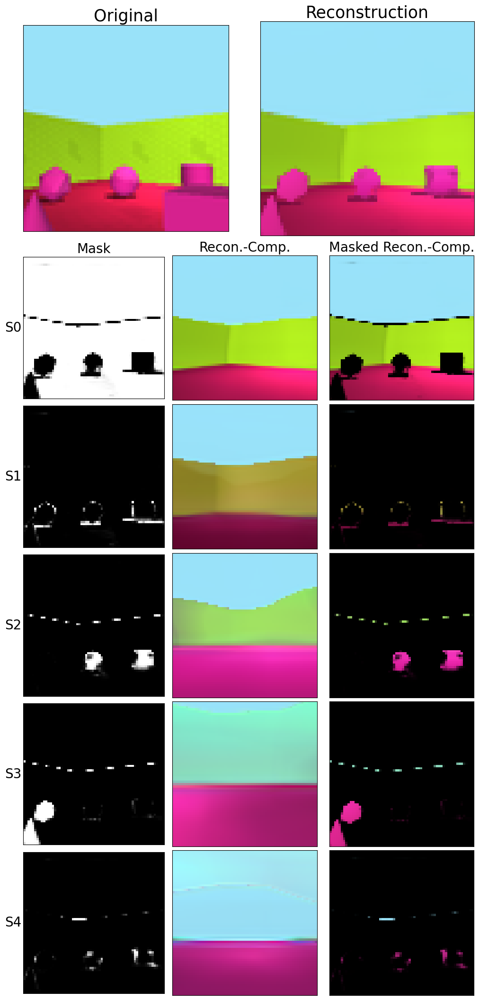

Average MSE Score: 0.00753
INFO: 'six_objects' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.

MONet_NoRMask_ObjectsRoom on Out-of-Distribution (Six Objects) Testing Data:

Sample #1:


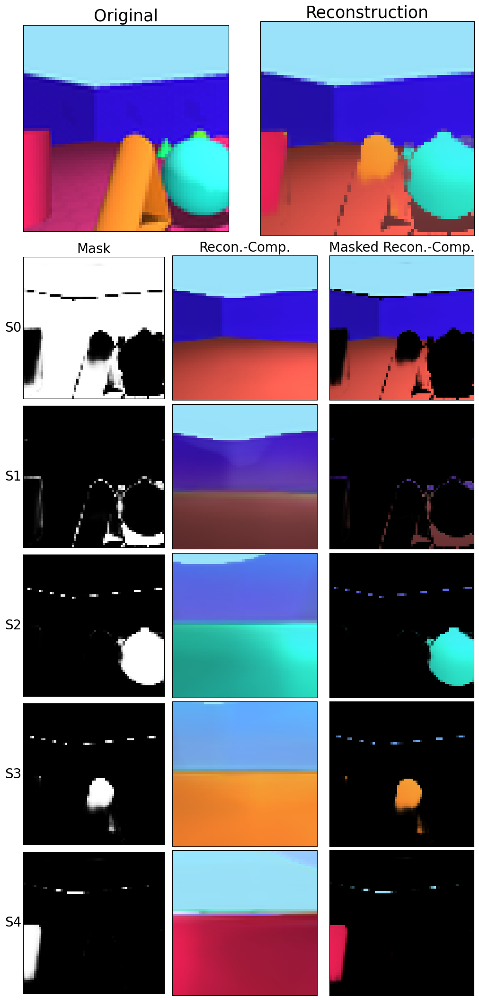

Sample #2:


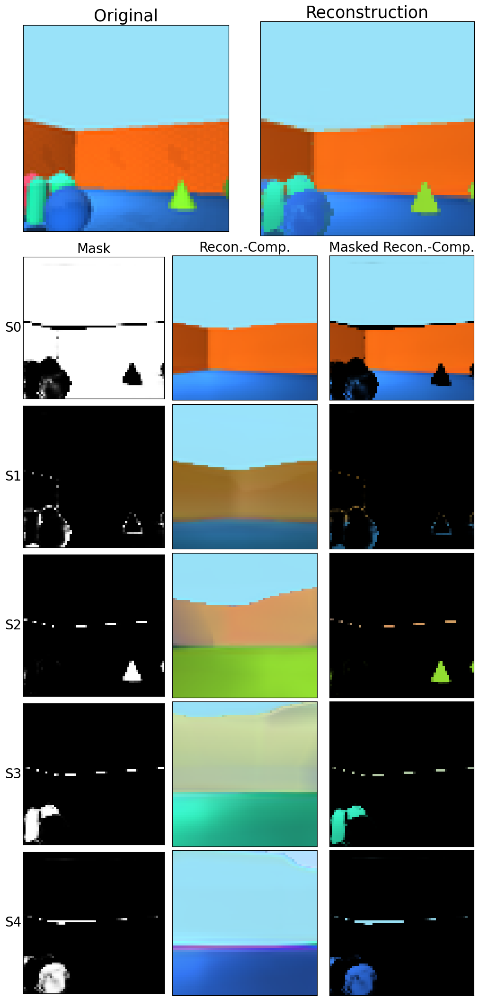

Average MSE Score: 0.00398


In [8]:
# This 5-slot model was trained in batches of 128 images (of 90,000) for 500 epochs with a learning rate of 0.0001

name = "MONet_NoRMask_ObjectsRoom"

# Load NoRMask model trained on MultiDSprites
model = monet_normask.MONet_NoRMask(5, 128, 0)
model.load_state_dict(
    torch.load(
        f"models/{name}.pt",
        weights_only=False,
        map_location=torch.device(device),
    )
)
model.eval()

# Load sample testing data
dataset = ObjectsRoom(
    "datasets",
    split="Test",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Testing Data:\n")
show_n_examples_normask(6, model, images)
normask_or_indist_mse = show_metrics_normask(model, dataset)

# Load sample out-of-distribution testing data
dataset = ObjectsRoom(
    "datasets",
    split="empty_room",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Out-of-Distribution (Empty Room) Testing Data:\n")
show_n_examples_normask(2, model, images)
normask_or_emptyroom_mse = show_metrics_normask(model, dataset)

# Load sample out-of-distribution testing data
dataset = ObjectsRoom(
    "datasets",
    split="identical_color",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Out-of-Distribution (Objects of Identical Colour) Testing Data:\n")
show_n_examples_normask(2, model, images)
normask_or_idencol_mse = show_metrics_normask(model, dataset)

# Load sample out-of-distribution testing data
dataset = ObjectsRoom(
    "datasets",
    split="six_objects",
    download=False,
    convert=False,
)
images = (dataset[:model.batch_size]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Out-of-Distribution (Six Objects) Testing Data:\n")
show_n_examples_normask(2, model, images)
normask_or_sixobj_mse = show_metrics_normask(model, dataset)



MONet_Mini_MultiDSprites on Coloured Testing Data:

Sample #1:


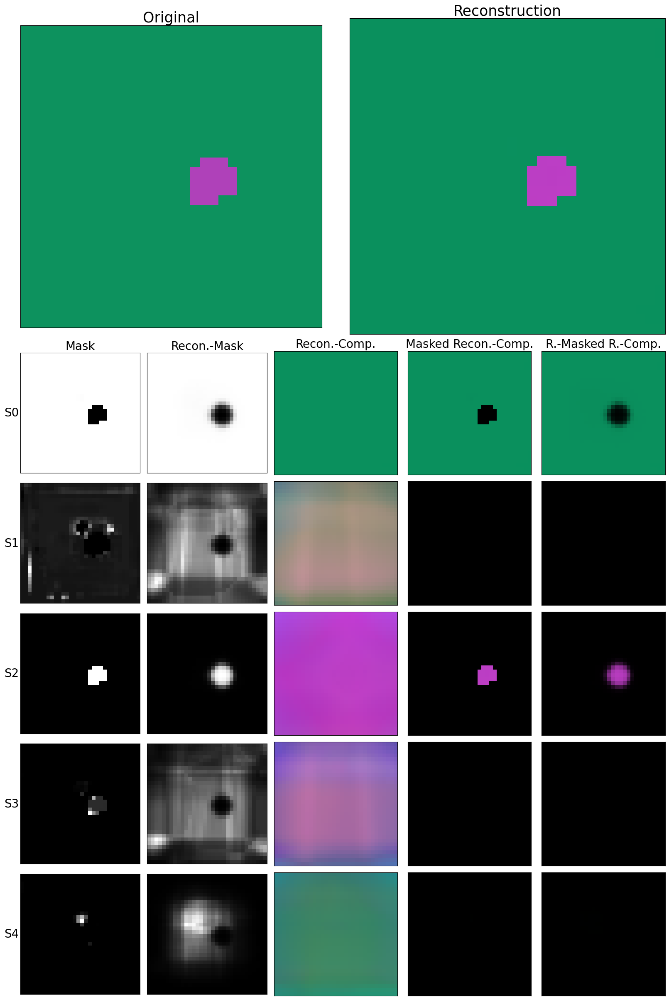

Sample #2:


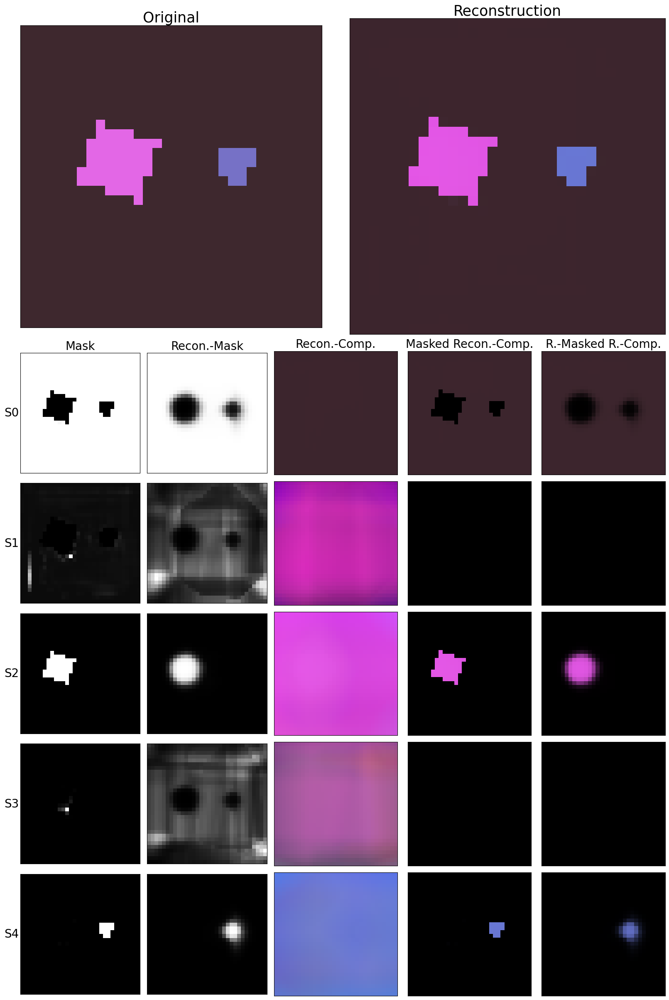

Sample #3:


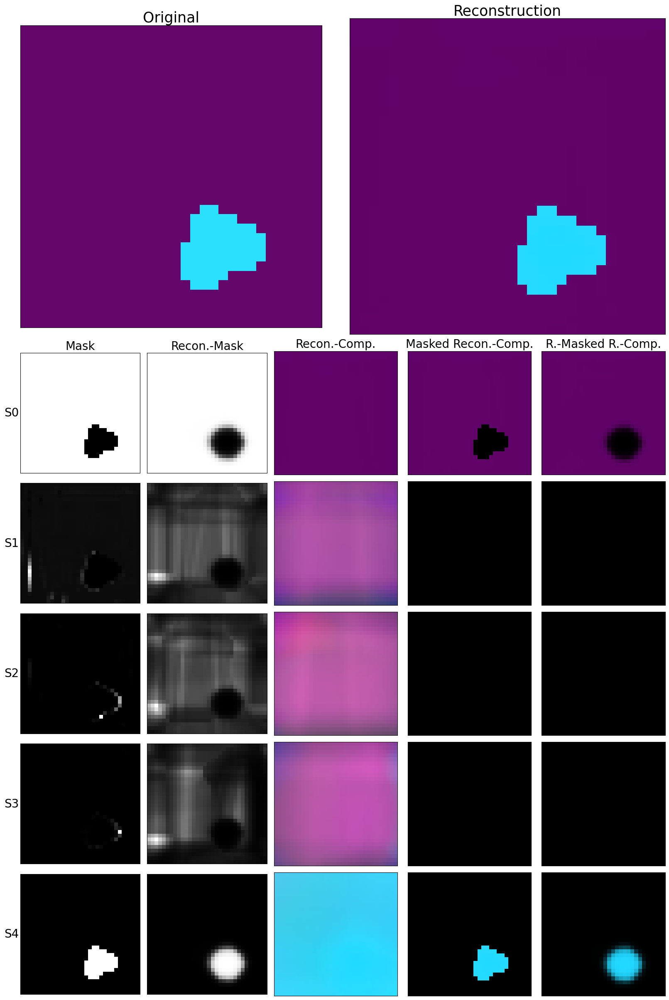

Sample #4:


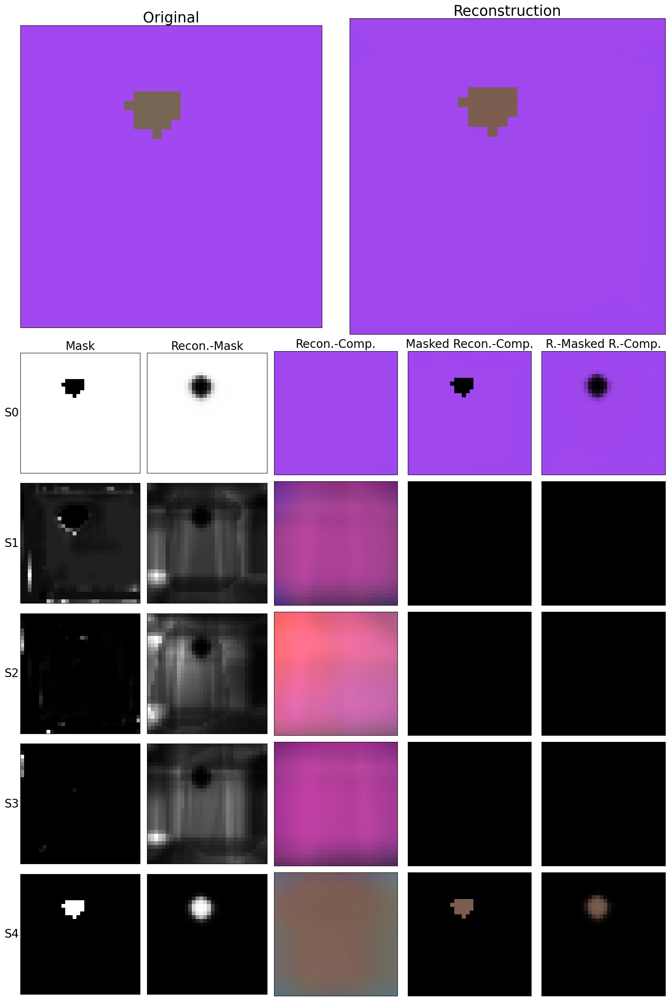

Average MSE Score: 0.00071

MONet_Mini_MultiDSprites on Grayscale Testing Data:

Sample #1:


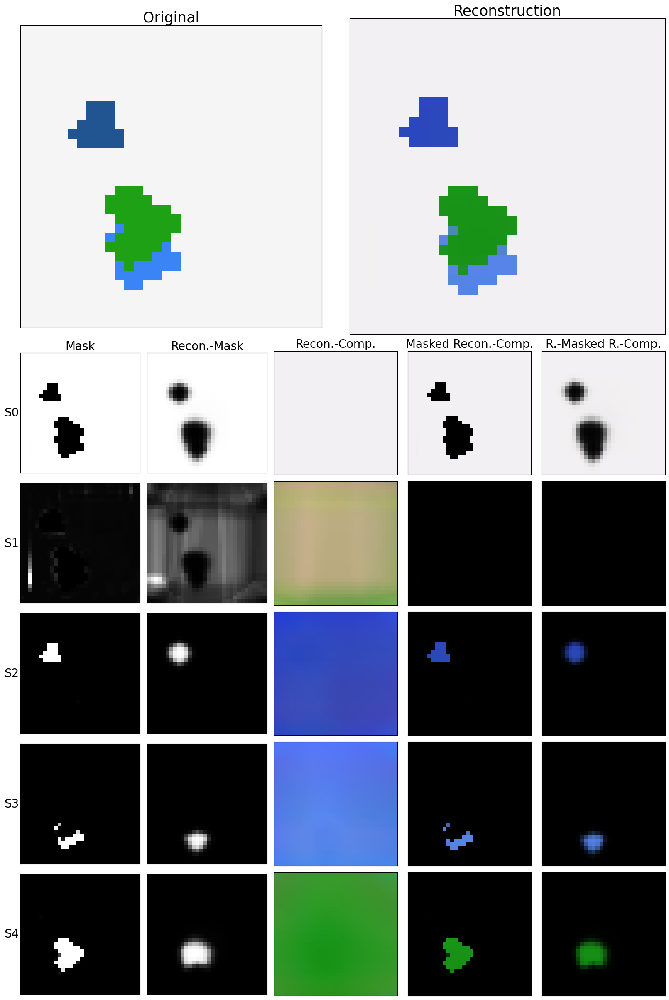

Sample #2:


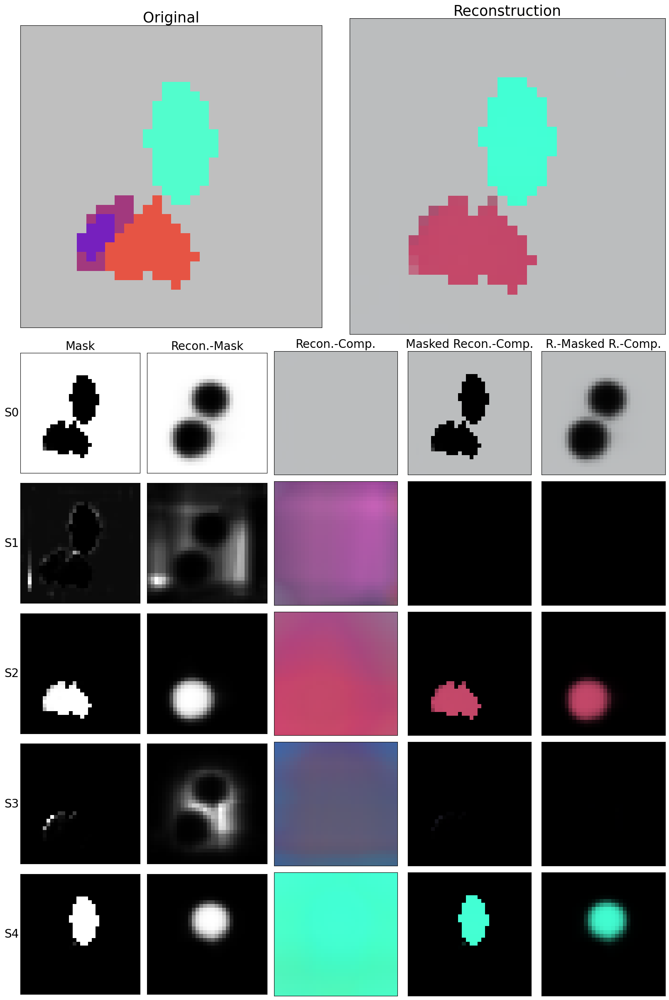

Sample #3:


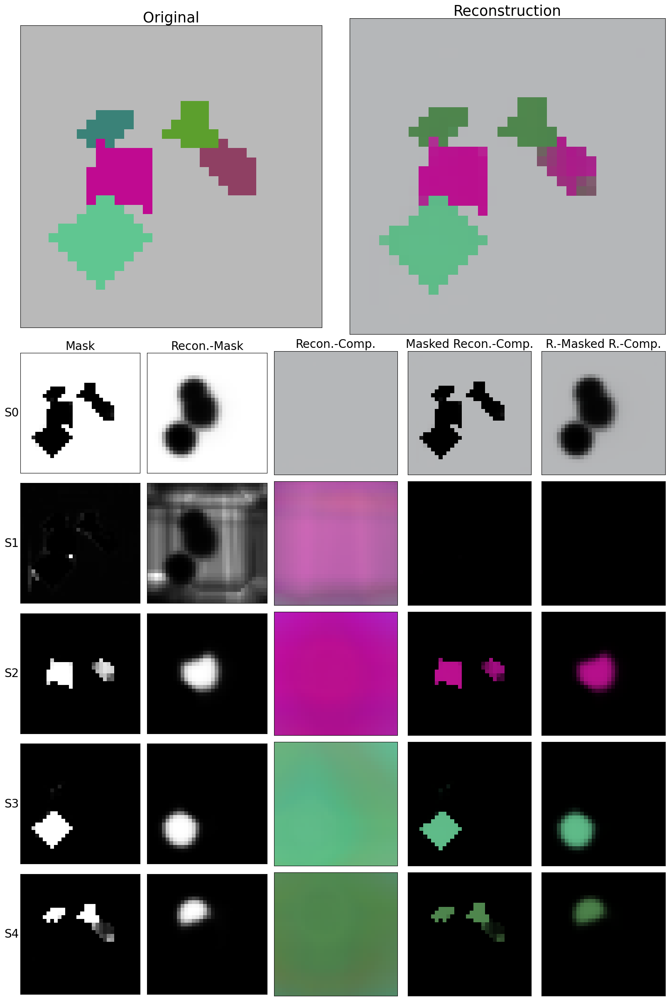

Sample #4:


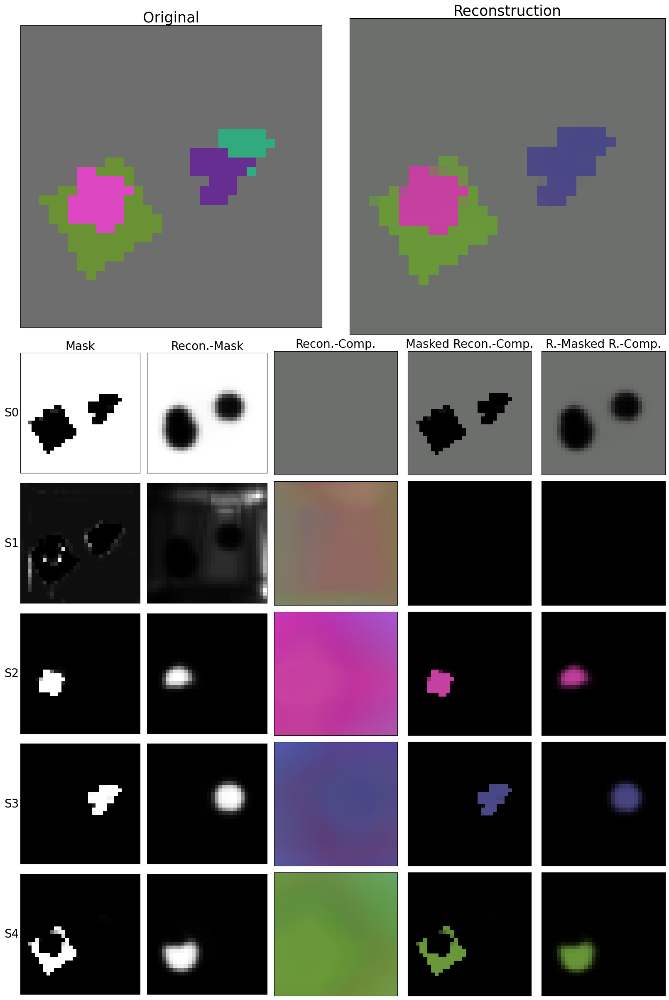

Average MSE Score: 0.00133


In [9]:
# This 5-slot model was trained in batches of 128 images (of 180,000) for 1000 epochs with a learning rate of 0.0001

name = "MONet_Mini_MultiDSprites"

# Load original model trained on MultiDSprites
model = monet_mini.MiniMONet(5, 128, 0)
model.load_state_dict(
    torch.load(
        f"models/{name}.pt",
        weights_only=False,
        map_location=torch.device(device),
    )
)
model.eval()

# Load sample testing data
dataset = MultiDSprites(
    "datasets",
    version="colored_on_colored",
    split="Test",
    transforms={"image": T.Resize(32, T.InterpolationMode.NEAREST)},
    download=False,
    convert=False,
)
images = (dataset[:model.batchsize]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Coloured Testing Data:\n")
show_n_examples_mini(4, model, images)
mini_mds_coloured_mse = show_metrics_mini(model, dataset)

# Load sample testing data
dataset = MultiDSprites(
    "datasets",
    version="colored_on_grayscale",
    split="Test",
    transforms={"image": T.Resize(32, T.InterpolationMode.NEAREST)},
    download=False,
    convert=False,
)
images = (dataset[:model.batchsize]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Grayscale Testing Data:\n")
show_n_examples_mini(4, model, images)
mini_mds_grayscale_mse = show_metrics_mini(model, dataset)



MONet_Mini_ObjectsRoom on Testing Data:

Sample #1:


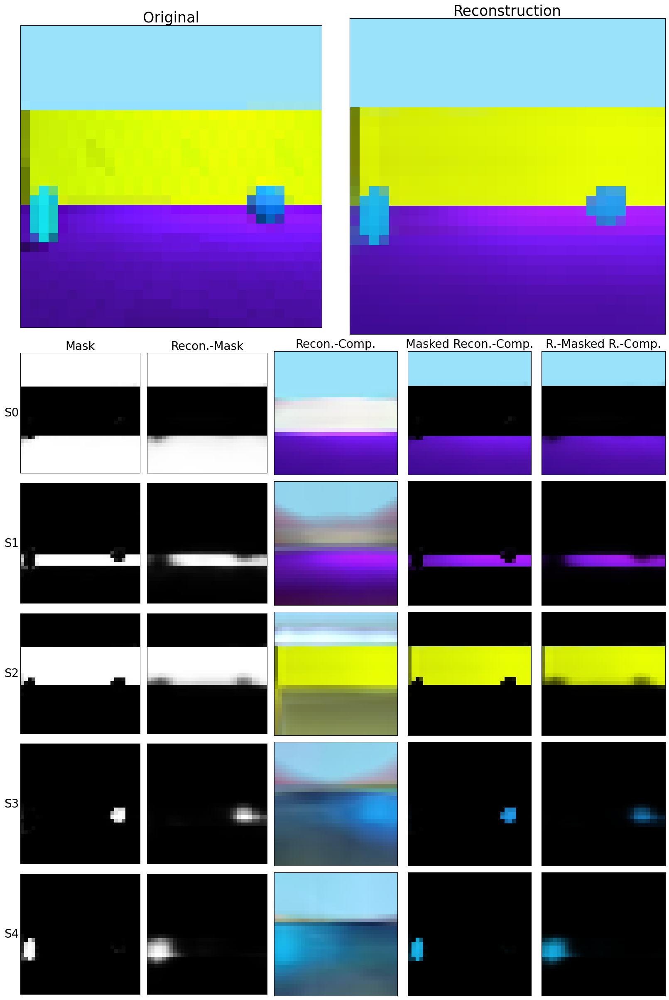

Sample #2:


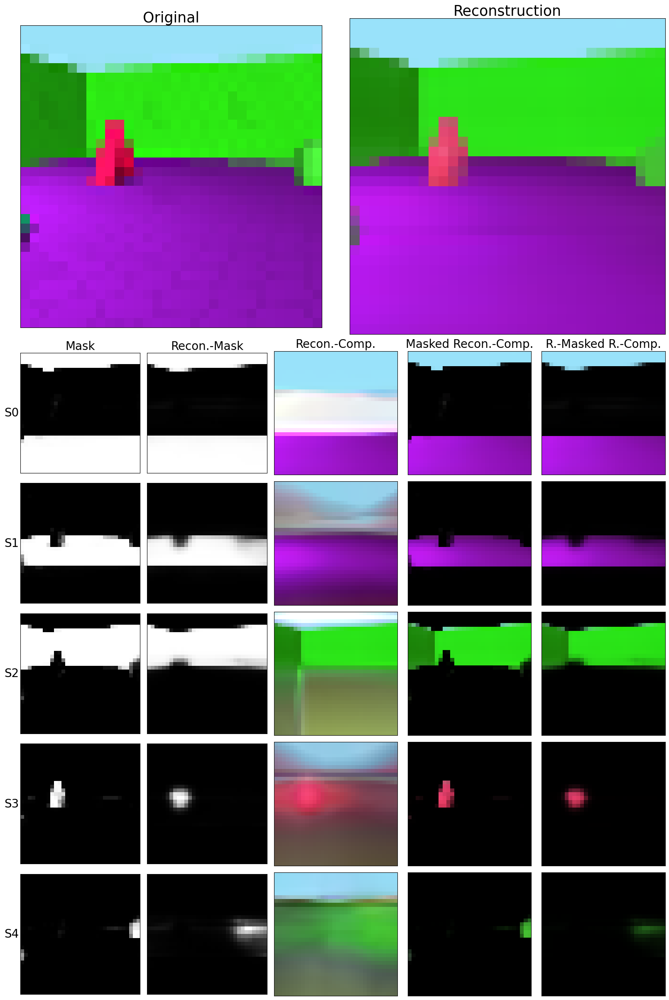

Sample #3:


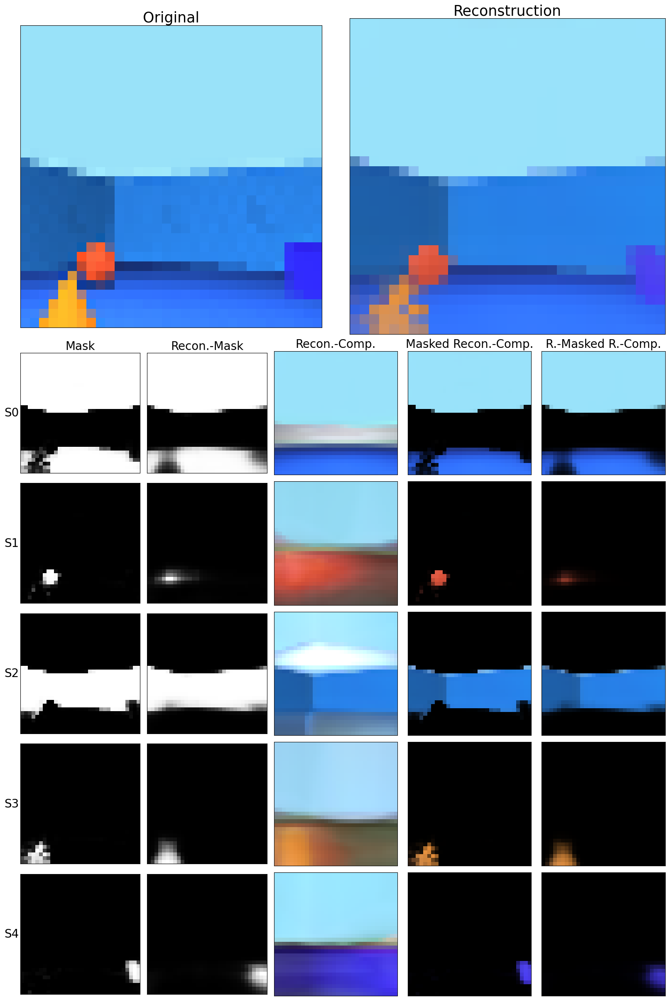

Sample #4:


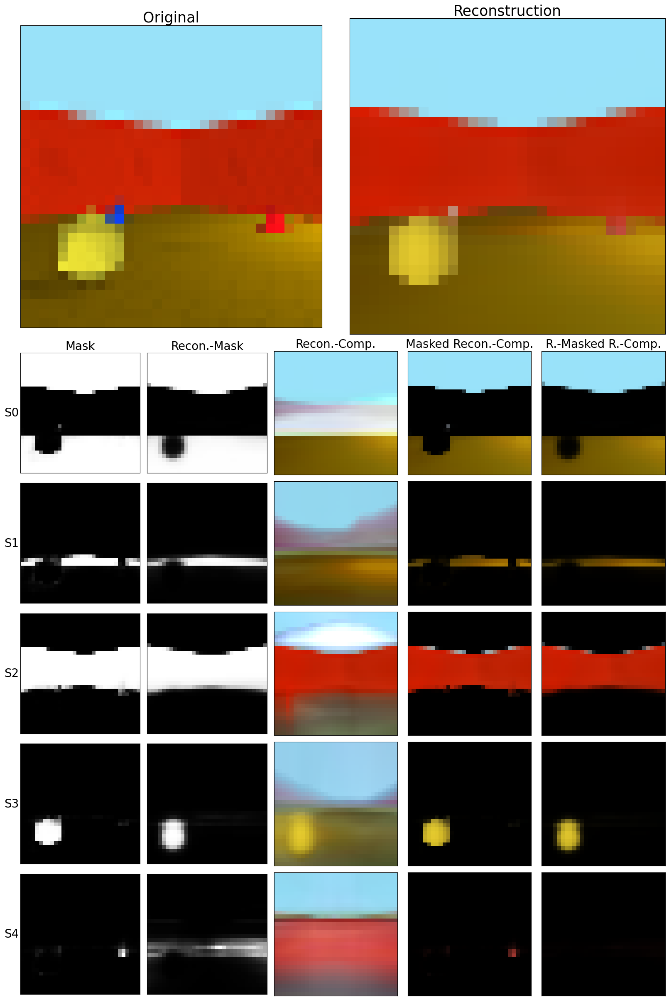

Sample #5:


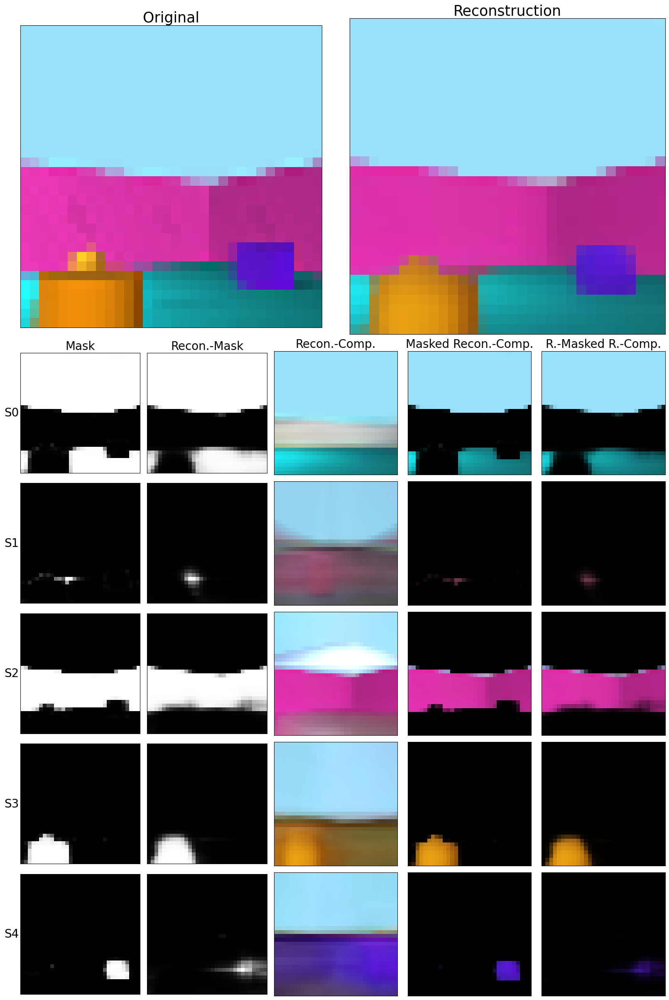

Sample #6:


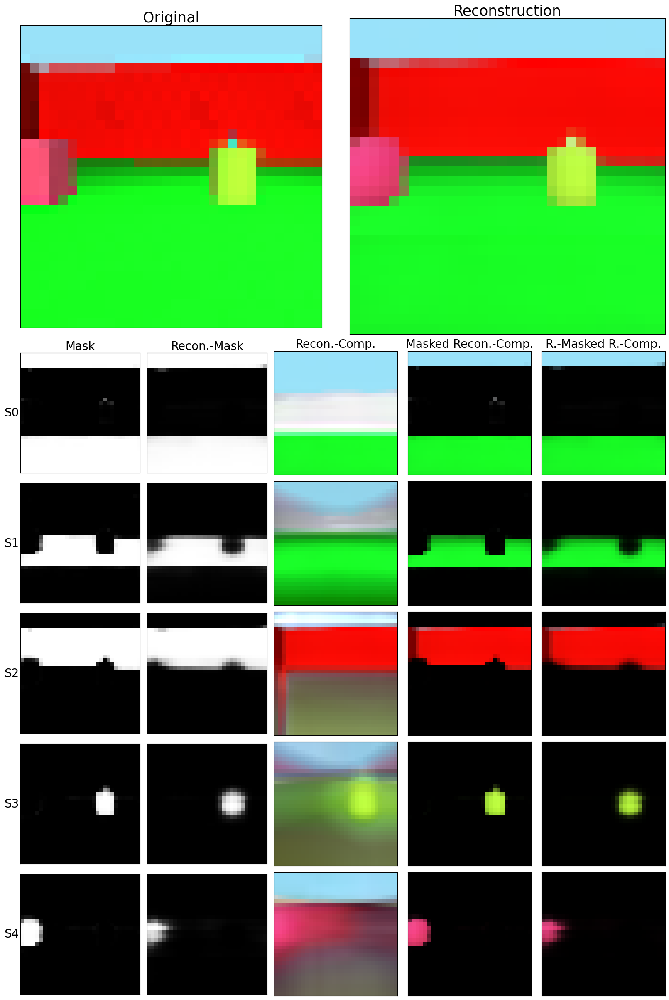

Average MSE Score: 0.00225
INFO: 'empty_room' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.

MONet_Mini_ObjectsRoom on Out-of-Distribution (Empty Room) Testing Data:

Sample #1:


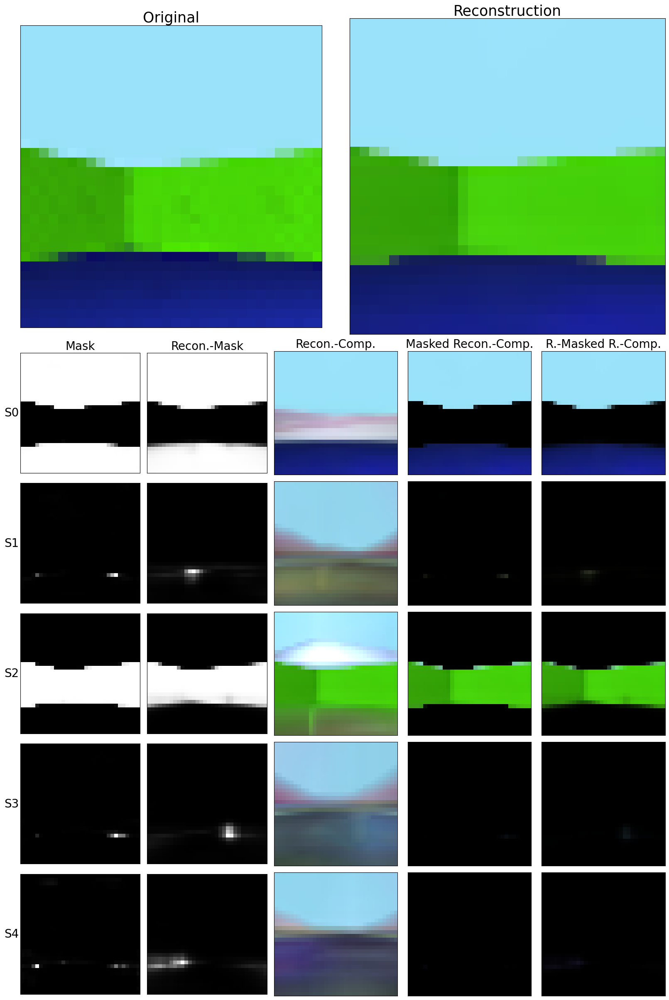

Sample #2:


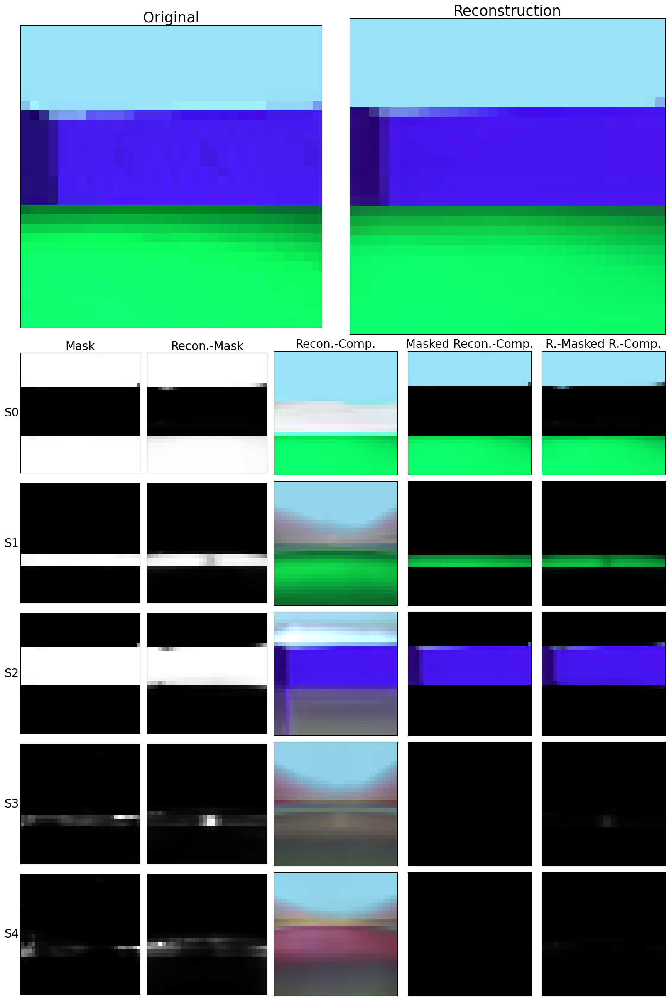

Average MSE Score: 0.00057
INFO: 'identical_color' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.

MONet_Mini_ObjectsRoom on Out-of-Distribution (Objects of Identical Colour) Testing Data:

Sample #1:


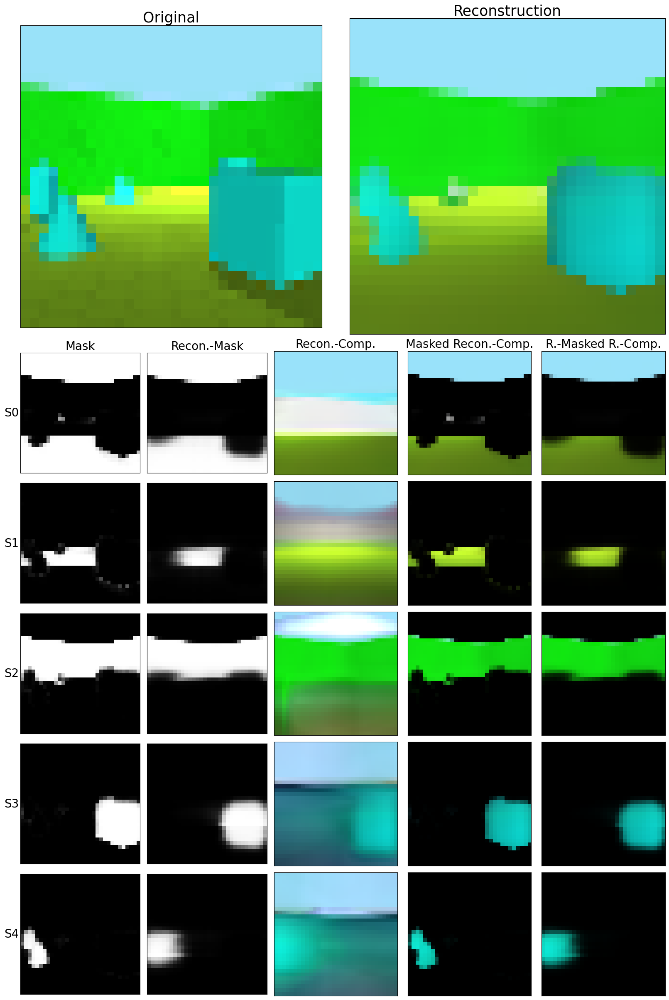

Sample #2:


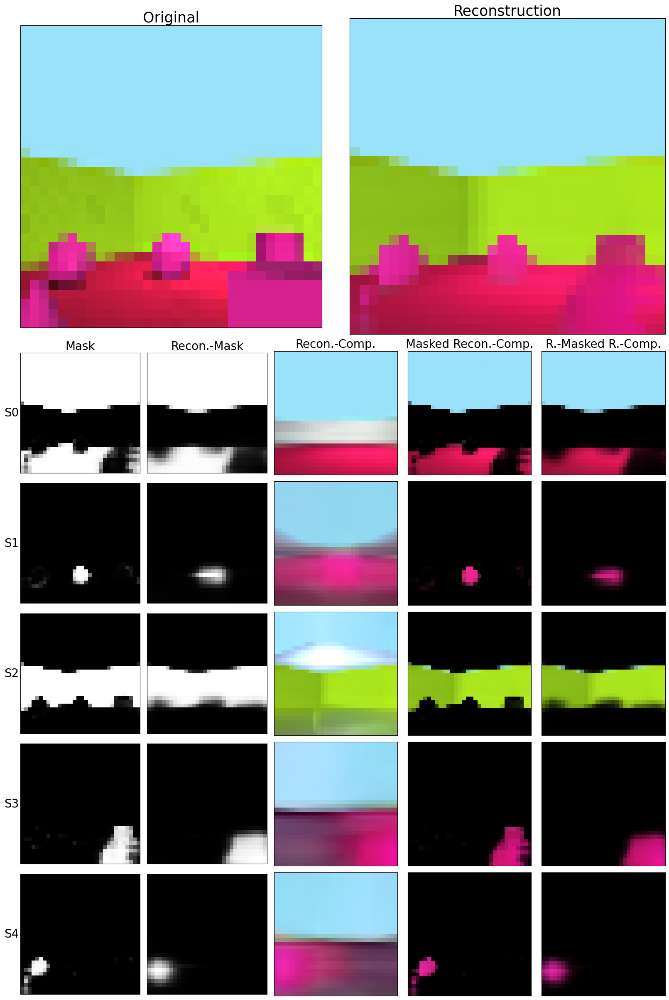

Average MSE Score: 0.00852
INFO: 'six_objects' is a special out-of-distribution 'Test' split and will allways return as ttv=[0, 922, 0], independent of the requested ttv.

MONet_Mini_ObjectsRoom on Out-of-Distribution (Six Objects) Testing Data:

Sample #1:


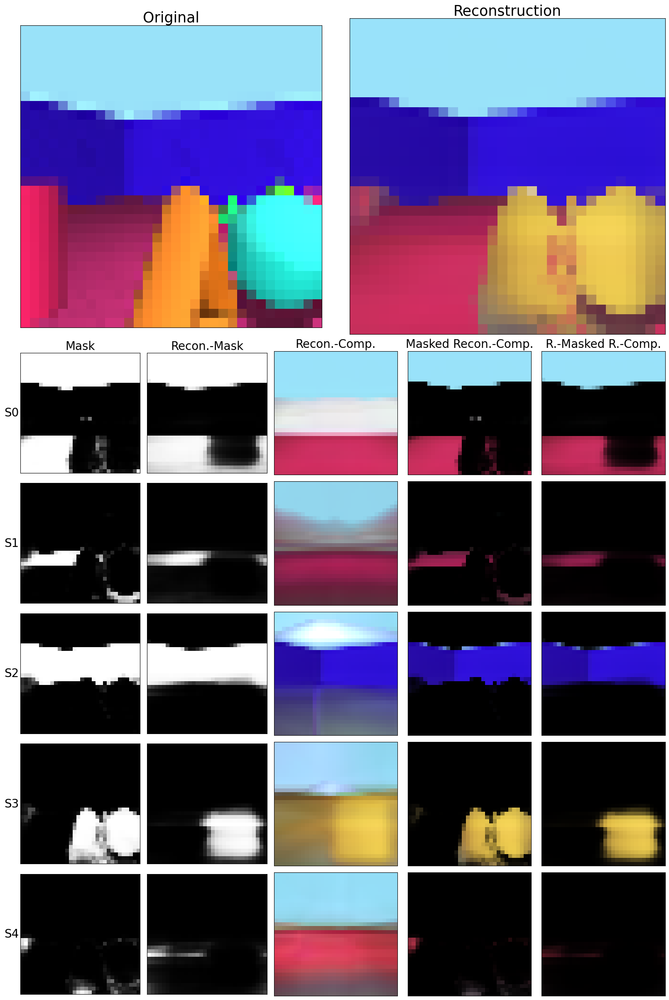

Sample #2:


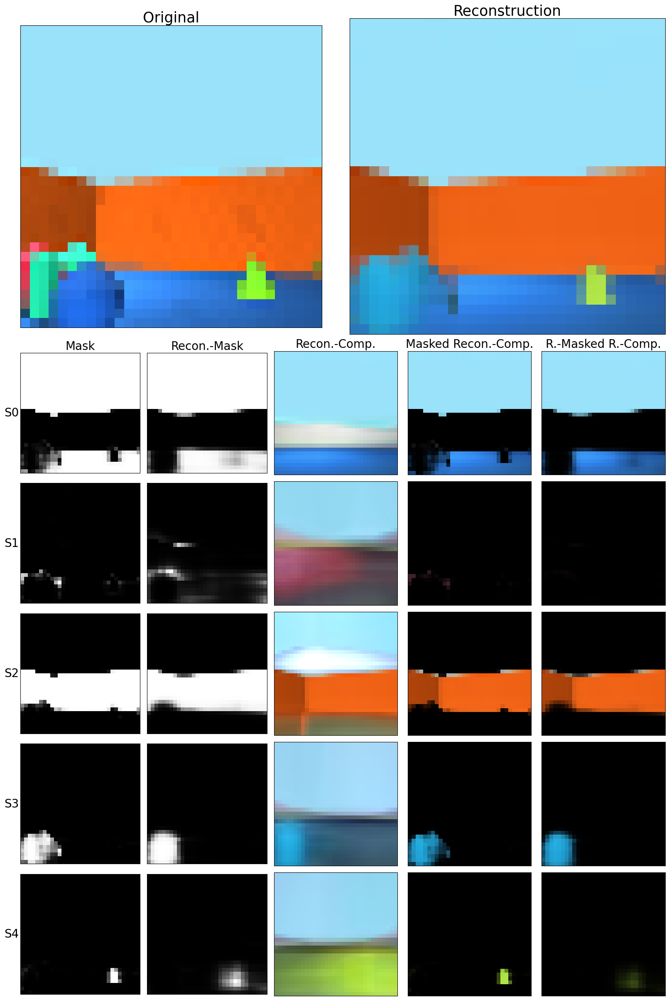

Average MSE Score: 0.00867


In [10]:
# This 5-slot model was trained in batches of 128 images (of 90,000) for 1000 epochs with a learning rate of 0.0001

name = "MONet_Mini_ObjectsRoom"

# Load original model trained on ObjectsRoom
model = monet_mini.MiniMONet(5, 128, 0)
model.load_state_dict(
    torch.load(
        f"models/{name}.pt",
        weights_only=False,
        map_location=torch.device(device),
    )
)
model.eval()

# Load sample testing data
dataset = ObjectsRoom(
    "datasets",
    split="Test",
    transforms={"image": T.Resize(32, T.InterpolationMode.NEAREST)},
    download=False,
    convert=False,
)
images = (dataset[:model.batchsize]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Testing Data:\n")
show_n_examples_mini(6, model, images)
mini_or_indist_mse = show_metrics_mini(model, dataset)

# Load sample out-of-distribution testing data
dataset = ObjectsRoom(
    "datasets",
    split="empty_room",
    transforms={"image": T.Resize(32, T.InterpolationMode.NEAREST)},
    download=False,
    convert=False,
)
images = (dataset[:model.batchsize]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Out-of-Distribution (Empty Room) Testing Data:\n")
show_n_examples_mini(2, model, images)
mini_or_emptyroom_mse = show_metrics_mini(model, dataset)

# Load sample out-of-distribution testing data
dataset = ObjectsRoom(
    "datasets",
    split="identical_color",
    transforms={"image": T.Resize(32, T.InterpolationMode.NEAREST)},
    download=False,
    convert=False,
)
images = (dataset[:model.batchsize]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Out-of-Distribution (Objects of Identical Colour) Testing Data:\n")
show_n_examples_mini(2, model, images)
mini_or_idencol_mse = show_metrics_mini(model, dataset)

# Load sample out-of-distribution testing data
dataset = ObjectsRoom(
    "datasets",
    split="six_objects",
    transforms={"image": T.Resize(32, T.InterpolationMode.NEAREST)},
    download=False,
    convert=False,
)
images = (dataset[:model.batchsize]["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Out-of-Distribution (Six Objects) Testing Data:\n")
show_n_examples_mini(2, model, images)
mini_or_sixobj_mse = show_metrics_mini(model, dataset)


In [11]:
# Summary of results in LaTeX table format
print("Results Summary Table (to be rendered by LaTeX):")
print()
print(f"\hline\hline")
print(f"\\multicolumn{{1}}{{c}}{{Model}} & \\multicolumn{{1}}{{c}}{{Testing Dataset}} & Reconstruction Score (MSE) \\\\")
print(f"\hline")
print(f"{{\\multirow{{2}}*{{\\texttt{{MONet\\_MultiDSprites}}}}}} & \\texttt{{MultiDSprites}}: ID & ${base_mds_coloured_mse:.5f}$ \\\\")
print(f" & \\texttt{{MultiDSprites}}: OOD: Grayscale & ${base_mds_grayscale_mse:.5f}$ \\\\")
print(f"\hline")
print(f"{{\\multirow{{4}}*{{\\texttt{{MONet\\_ObjectsRoom}}}}}} & \\texttt{{ObjectsRoom}}: ID & ${base_or_indist_mse:.5f}$ \\\\")
print(f" & \\texttt{{ObjectsRoom}}: OOD: Empty Room & ${base_or_emptyroom_mse:.5f}$ \\\\")
print(f" & \\texttt{{ObjectsRoom}}: OOD: Identical Colour & ${base_or_idencol_mse:.5f}$ \\\\")
print(f" & \\texttt{{ObjectsRoom}}: OOD: Six Objects & ${base_or_sixobj_mse:.5f}$ \\\\")
print(f"\hline")
print(f"{{\\multirow{{2}}*{{\\texttt{{MONet\_NoRMask\_MultiDSprites}}}}}} & \\texttt{{MultiDSprites}}: ID & ${normask_mds_coloured_mse:.5f}$ \\\\")
print(f" & \\texttt{{MultiDSprites}}: OOD: Grayscale & ${normask_mds_grayscale_mse:.5f}$ \\\\")
print(f"\hline")
print(f"{{\\multirow{{4}}*{{\\texttt{{MONet\\_NoRMask\\_ObjectsRoom}}}}}} & \\texttt{{ObjectsRoom}}: ID & ${normask_or_indist_mse:.5f}$ \\\\")
print(f" & \\texttt{{ObjectsRoom}}: OOD: Empty Room & ${normask_or_emptyroom_mse:.5f}$ \\\\")
print(f" & \\texttt{{ObjectsRoom}}: OOD: Identical Colour & ${normask_or_idencol_mse:.5f}$ \\\\")
print(f" & \\texttt{{ObjectsRoom}}: OOD: Six Objects & ${normask_or_sixobj_mse:.5f}$ \\\\")
print(f"\hline")
print(f"{{\\multirow{{2}}*{{\\texttt{{MONet\\_Mini\\_MultiDSprites}}}}}} & \\texttt{{MultiDSprites}}: ID & ${mini_mds_coloured_mse:.5f}$ \\\\")
print(f" & \\texttt{{MultiDSprites}}: OOD: Grayscale & ${mini_mds_grayscale_mse:.5f}$ \\\\")
print(f"\hline")
print(f"{{\\multirow{{4}}*{{\\texttt{{MONet\\_Mini\\_ObjectsRoom}}}}}} & \\texttt{{ObjectsRoom}}: ID & ${mini_or_indist_mse:.5f}$ \\\\")
print(f" & \\texttt{{ObjectsRoom}}: OOD: Empty Room & ${mini_or_emptyroom_mse:.5f}$ \\\\")
print(f" & \\texttt{{ObjectsRoom}}: OOD: Identical Colour & ${mini_or_idencol_mse:.5f}$ \\\\")
print(f" & \\texttt{{ObjectsRoom}}: OOD: Six Objects & ${mini_or_sixobj_mse:.5f}$ \\\\")
print(f"\hline\hline")


Results Summary Table (to be rendered by LaTeX):

\hline\hline
\multicolumn{1}{c}{Model} & \multicolumn{1}{c}{Testing Dataset} & Reconstruction Score (MSE) \\
\hline
{\multirow{2}*{\texttt{MONet\_MultiDSprites}}} & \texttt{MultiDSprites}: ID & $0.00042$ \\
 & \texttt{MultiDSprites}: OOD: Grayscale & $0.00078$ \\
\hline
{\multirow{4}*{\texttt{MONet\_ObjectsRoom}}} & \texttt{ObjectsRoom}: ID & $0.00119$ \\
 & \texttt{ObjectsRoom}: OOD: Empty Room & $0.00046$ \\
 & \texttt{ObjectsRoom}: OOD: Identical Colour & $0.00733$ \\
 & \texttt{ObjectsRoom}: OOD: Six Objects & $0.00728$ \\
\hline
{\multirow{2}*{\texttt{MONet\_NoRMask\_MultiDSprites}}} & \texttt{MultiDSprites}: ID & $0.00013$ \\
 & \texttt{MultiDSprites}: OOD: Grayscale & $0.00041$ \\
\hline
{\multirow{4}*{\texttt{MONet\_NoRMask\_ObjectsRoom}}} & \texttt{ObjectsRoom}: ID & $0.00098$ \\
 & \texttt{ObjectsRoom}: OOD: Empty Room & $0.00032$ \\
 & \texttt{ObjectsRoom}: OOD: Identical Colour & $0.00753$ \\
 & \texttt{ObjectsRoom}: OOD: Si

In [12]:
# Summary of results in text table format
print("Results Summary Table (to be viewed as plain text):")
print()
print(f"+=====================================================================================================+")
print(f"|            Model              |           Testing Dataset            |  Reconstruction Score (MSE)  |")
print(f"+-------------------------------+--------------------------------------+------------------------------+")
print(f"|  MONet_MultiDSprites          |  MultiDSprites: ID                   |           {base_mds_coloured_mse:.5f}            |")
print(f"|  MONet_MultiDSprites          |  MultiDSprites: OOD: Grayscale       |           {base_mds_grayscale_mse:.5f}            |")
print(f"+-------------------------------+--------------------------------------+------------------------------+")
print(f"|  MONet_ObjectsRoom            |  ObjectsRoom: ID                     |           {base_or_indist_mse:.5f}            |")
print(f"|  MONet_ObjectsRoom            |  ObjectsRoom: OOD: Empty Room        |           {base_or_emptyroom_mse:.5f}            |")
print(f"|  MONet_ObjectsRoom            |  ObjectsRoom: OOD: Identical Colour  |           {base_or_idencol_mse:.5f}            |")
print(f"|  MONet_ObjectsRoom            |  ObjectsRoom: OOD: Six Objects       |           {base_or_sixobj_mse:.5f}            |")
print(f"+-------------------------------+--------------------------------------+------------------------------+")
print(f"|  MONet_NoRMask_MultiDSprites  |  MultiDSprites: ID                   |           {normask_mds_coloured_mse:.5f}            |")
print(f"|  MONet_NoRMask_MultiDSprites  |  MultiDSprites: OOD: Grayscale:      |           {normask_mds_grayscale_mse:.5f}            |")
print(f"+-------------------------------+--------------------------------------+------------------------------+")
print(f"|  MONet_NoRMask_ObjectsRoom    |  ObjectsRoom: ID                     |           {normask_or_indist_mse:.5f}            |")
print(f"|  MONet_NoRMask_ObjectsRoom    |  ObjectsRoom: OOD: Empty Room        |           {normask_or_emptyroom_mse:.5f}            |")
print(f"|  MONet_NoRMask_ObjectsRoom    |  ObjectsRoom: OOD: Identical Colour  |           {normask_or_idencol_mse:.5f}            |")
print(f"|  MONet_NoRMask_ObjectsRoom    |  ObjectsRoom: OOD: Six Objects       |           {normask_or_sixobj_mse:.5f}            |")
print(f"+-------------------------------+--------------------------------------+------------------------------+")
print(f"|  MONet_Mini_MultiDSprites     |  MultiDSprites: ID                   |           {mini_mds_coloured_mse:.5f}            |")
print(f"|  MONet_Mini_MultiDSprites     |  MultiDSprites: OOD: Grayscale       |           {mini_mds_grayscale_mse:.5f}            |")
print(f"+-------------------------------+--------------------------------------+------------------------------+")
print(f"|  MONet_Mini_ObjectsRoom       |  ObjectsRoom: ID                     |           {mini_or_indist_mse:.5f}            |")
print(f"|  MONet_Mini_ObjectsRoom       |  ObjectsRoom: OOD: Empty Room        |           {mini_or_emptyroom_mse:.5f}            |")
print(f"|  MONet_Mini_ObjectsRoom       |  ObjectsRoom: OOD: Identical Colour  |           {mini_or_idencol_mse:.5f}            |")
print(f"|  MONet_Mini_ObjectsRoom       |  ObjectsRoom: OOD: Six Objects       |           {mini_or_sixobj_mse:.5f}            |")
print(f"+=====================================================================================================+")


Results Summary Table (to be viewed as plain text):

+=====================================================================================================+
|            Model              |           Testing Dataset            |  Reconstruction Score (MSE)  |
+-------------------------------+--------------------------------------+------------------------------+
|  MONet_MultiDSprites          |  MultiDSprites: ID                   |           0.00042            |
|  MONet_MultiDSprites          |  MultiDSprites: OOD: Grayscale       |           0.00078            |
+-------------------------------+--------------------------------------+------------------------------+
|  MONet_ObjectsRoom            |  ObjectsRoom: ID                     |           0.00119            |
|  MONet_ObjectsRoom            |  ObjectsRoom: OOD: Empty Room        |           0.00046            |
|  MONet_ObjectsRoom            |  ObjectsRoom: OOD: Identical Colour  |           0.00733            |
|  MONet_Ob

### Application: ARC-AGI

#### ARC-AGI Summary

The [Abstract and Reasoning Corpus for Artificial General Intelligence](https://arxiv.org/abs/1911.01547) (`ARC-AGI`) is a challenging IQ-test-inspired benchmark designed to evaluate the fluid intelligence of an artificial intelligence system. It tests an agent's ability to learn on-the-fly by applying natural algorithmic transforms learned from a few demonstration pairs to grids containing abstract objects, something that [humans excel at but AI agents struggle with](https://arxiv.org/abs/2412.04604). One important first step taken by an agent tackling an `ARC-AGI` task could be to extract a higher-level, object-centric representation of the lower-level pixel-based grids, which is exactly what `MONet` does.

#### Issues

Although we originally chose to reimplement `MONet` with this application in mind, this application proved to be very difficult for the model. `ARC-AGI` grids present many practical challenges to `MONet` that complicate applying the model directly to this domain:

* Their format: grids come in variable sizes, ranging from $1\times1$ to $30\times30$. This presents a pragmatic challenge for interfacing with the model; presenting each grid in a consistent manner is difficult.
* Their composition: many grids consist of a few discrete objects on a black background, but others are not well-suited to an object-centric representation (i.e., many groups of pixels may not have well-defined object assignments). Additionally, in many cases, it may be unclear what pixels should constitue an object until the transformation is observed, but `MONet` only deals in static images.
* Their amount: there are only $7,000$ grids in total, which is not ideal for training such a large model. For reference, the other datasets used contain $100,000$ images.

These issues exist, but are relatively small. They can be (at least partially) mitigated by simple strategies: all grids can be scaled up to a standard size, those irrelevant examples can be ignored when evaluating the model (ideally, these examples would be removed from the dataset to prevent the model training on them), and the model can be trained on `ARC-AGI` data in conjunction with other (possibly pre-existing, possibly synthetic based on `ARC-AGI`) datasets.

However, more thorough experimentation revealed deeper issues with `MONet` indicating it is not suitable for this application on a more fundamental level:

* The model is missing some required inductive biases. The original introduction of `ARC-AGI` lists some 'priors' that a successful solver of the problem must have; among them is the notion that objects persist even when occluded (in fact, some tasks are directly related to 'de-noising' or moving objects along a hypothetical third dimension. However, `MONet` fails to interpolate occluded objects; it recognizes objects that are partially occluded, but does not fill in their missing portions in their generated nor reconstructed mask very well. Another required prior is the notion of object persistence, necessitating object segmentations based on both the input and output grid. `MONet` has no mechanism for object persistence between images and does not generate segmentation masks in a consistent order, making it lacking in this way.
* The model does not fully understand what constitutes an object. For example, `MONet` is overly colour-sensitive: it fails to differentiate nearby, but separate, objects of identical colour (note: perhaps enforcing or encouraging the spatial contiguity of masks in the loss function could improve the model in this respect) and fails to recognize multi-coloured objects (which do not exist in the other datasets used, but may exist in `ARC-AGI`).

While these issues may be possible to mitigate on some level, potential fixes would require much more fundamental changes to the model architecture (to the extent where other model architectures should just be pursued instead).
    
#### Attempts

There are simply not enough `ARC-AGI` grids to meaningfully train the model in the same manner as for the other datasets. We trained one model (`MONet_ARCAGI_1`) on just `ARC-AGI` data (requiring many more epochs and a lower learning rate) and another (`MONet_ARCAGI_2`) on a combination of datasets (the Grayscale version of `MultiDSprites` due to its similar visual nature to many `ARC-AGI` grids; training in conjunction with `ObjectsRoom` proved counterproductive), but both models still struggled on withheld testing data. In both cases, the `NoRMask` version of `MONet` was used because this version of the model performed the best (as measured by our MSE reconstruction score).

The exercise of applying `MONet` to `ARC-AGI` grids exposed multiple of the architecture's shortcomings that render it ineffective for the `ARC-AGI` application domain. As such, for applications in future research, different perceptual models for `ARC-AGI` will be explored.



MONet_ARCAGI_1 on Testing Data:

Sample #1:


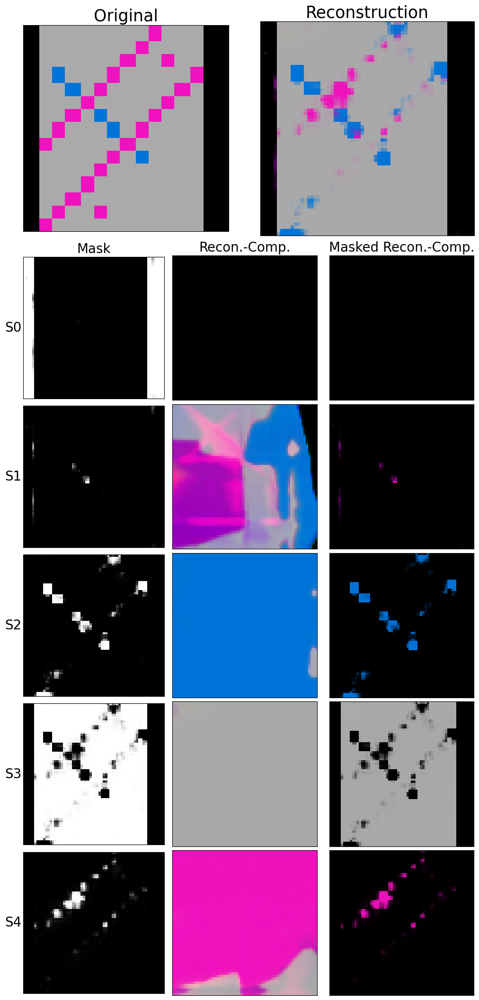

Sample #2:


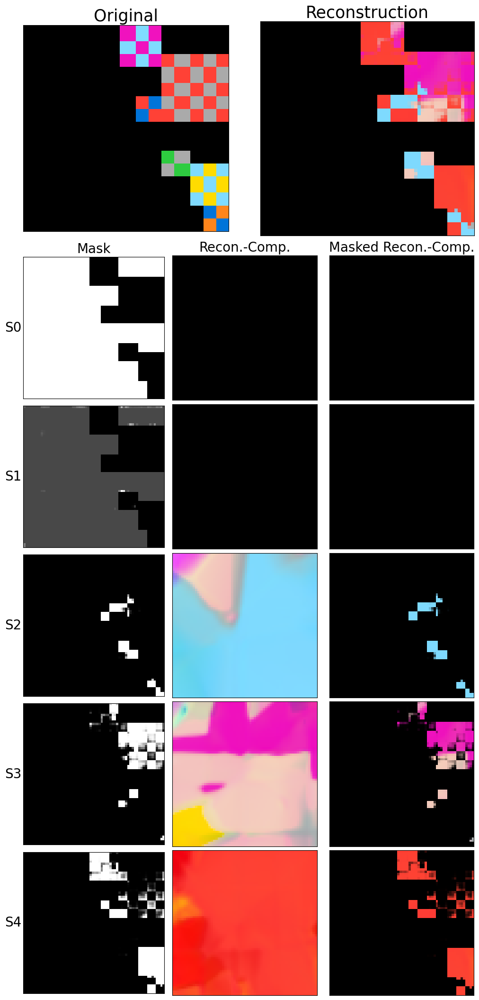

Sample #3:


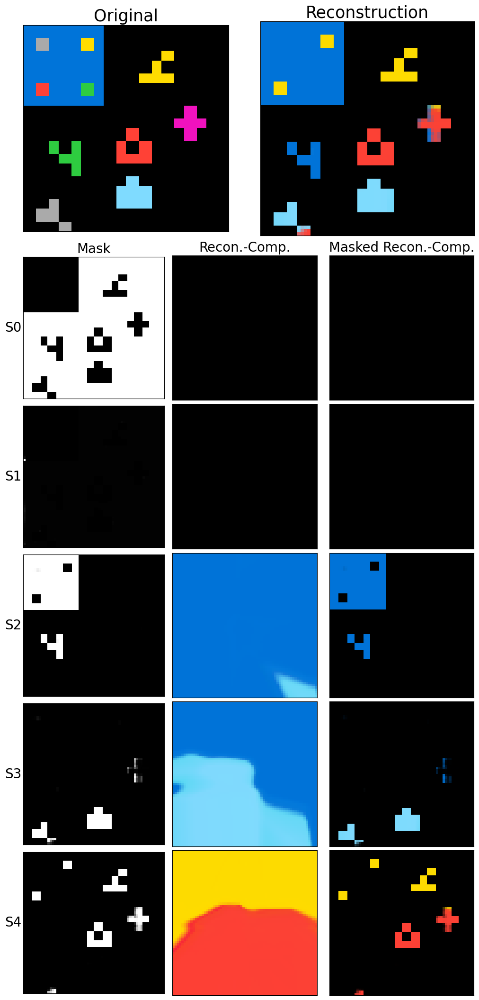

Sample #4:


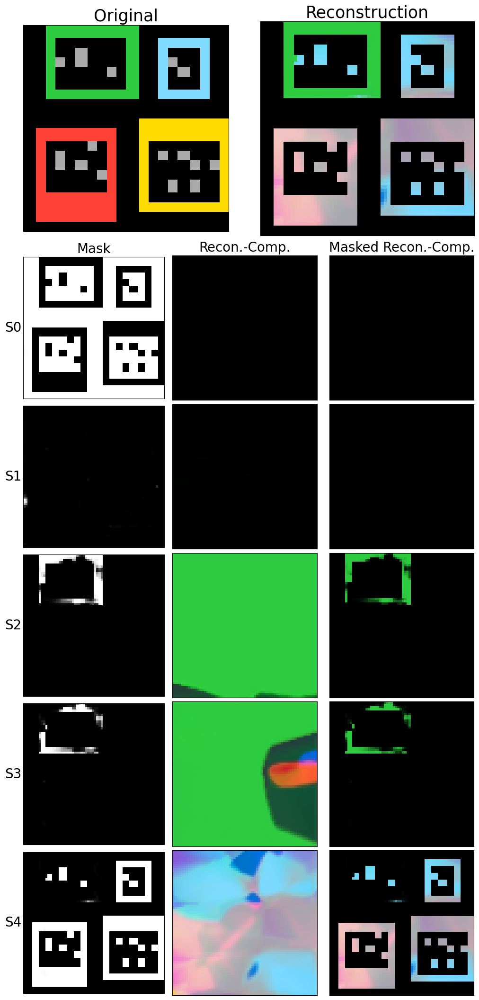

Sample #5:


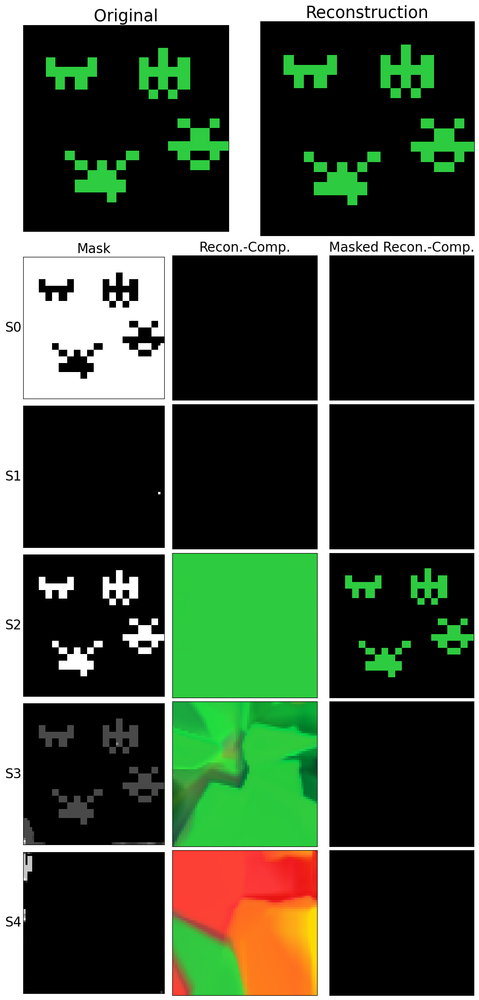

Sample #6:


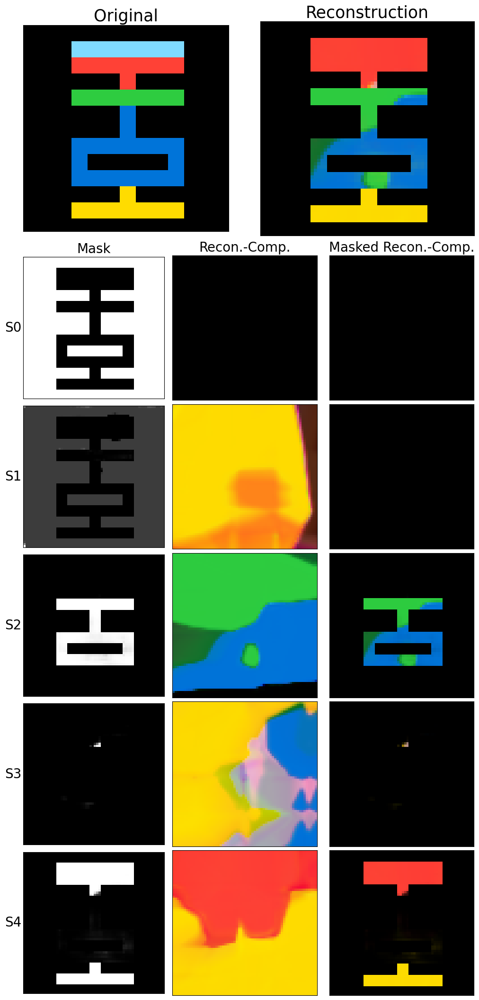

Sample #7:


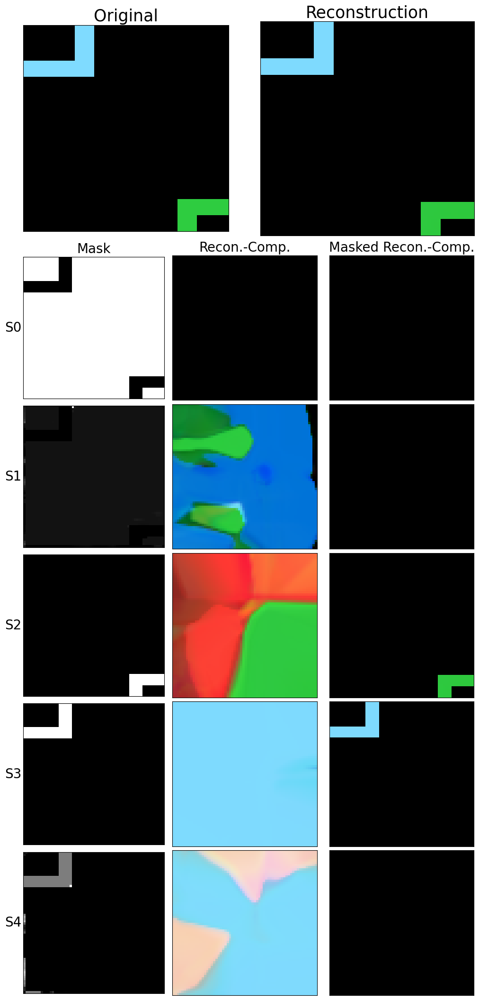

Sample #8:


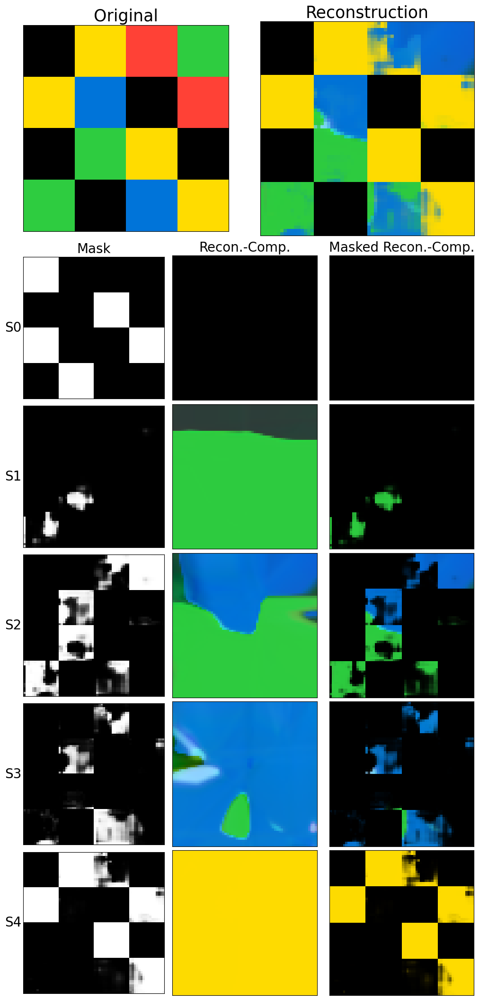

Sample #9:


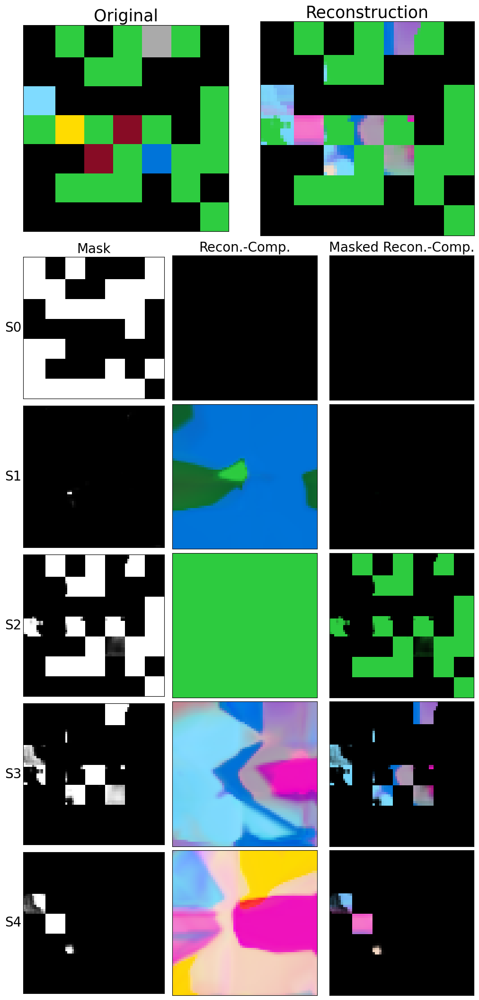

Sample #10:


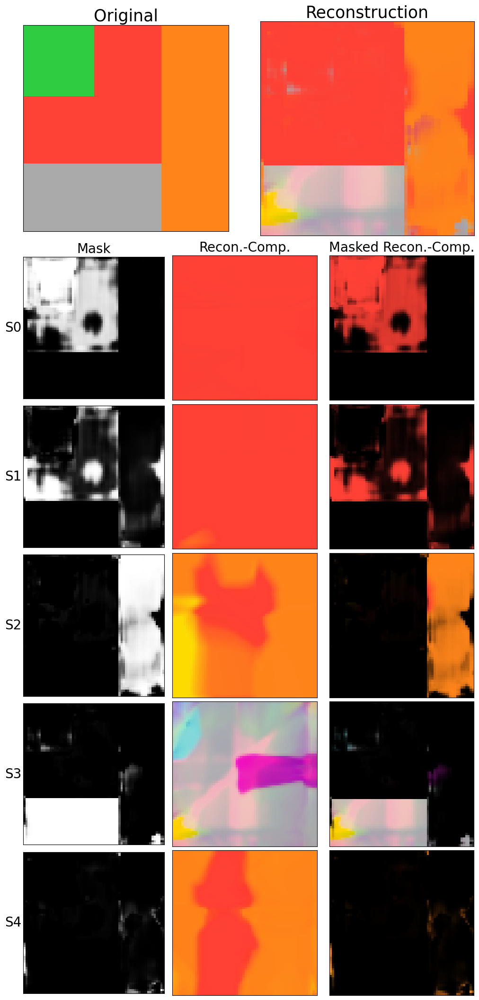

Average MSE Score: 0.01819


In [13]:
# This 5-slot model was trained in batches of 128 images (of 3,436) for 50,000 epochs with a learning rate of 0.00005

name = "MONet_ARCAGI_1"

# Load NoRMask version of model trained on only ARC-AGI
model = monet_normask.MONet_NoRMask(5, 128, 0)
model.load_state_dict(
    torch.load(
        f"models/{name}.pt",
        weights_only=False,
        map_location=torch.device(device),
    )
)
model.eval()

# Load sample testing data
dataset = ARCAGI(
    "datasets",
    version="zoomed",
    split="Test",
)
dataloader = DataLoader(
    dataset,
    batch_size=model.batch_size,
    num_workers=0,
    shuffle=True,
)
images = (next(iter(dataloader))["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Testing Data:\n")
show_n_examples_normask(10, model, images)
arc_1_mse = show_metrics_normask(model, dataset)



MONet_ARCAGI_2 on Testing Data:

Sample #1:


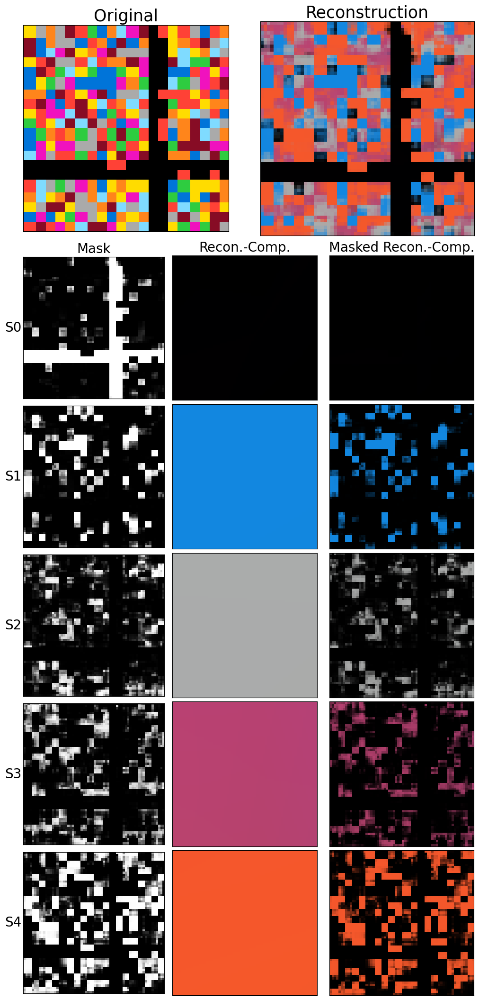

Sample #2:


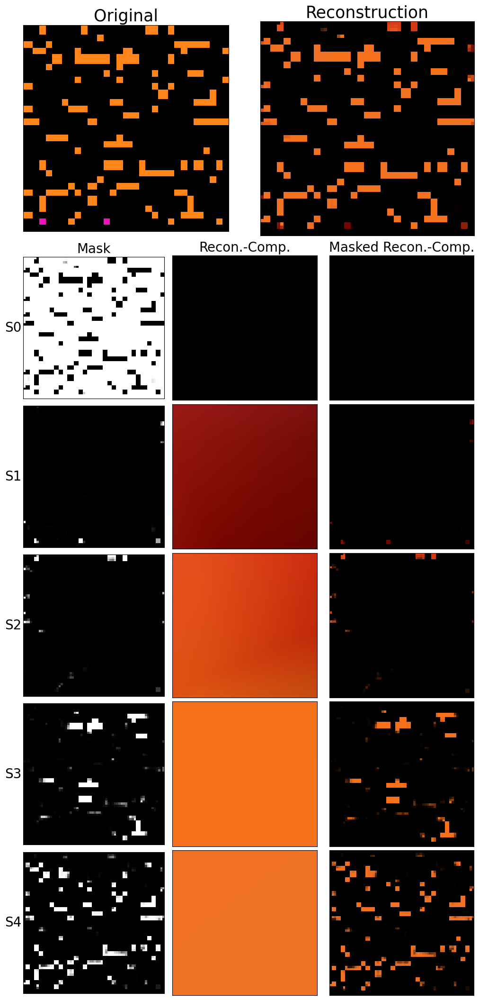

Sample #3:


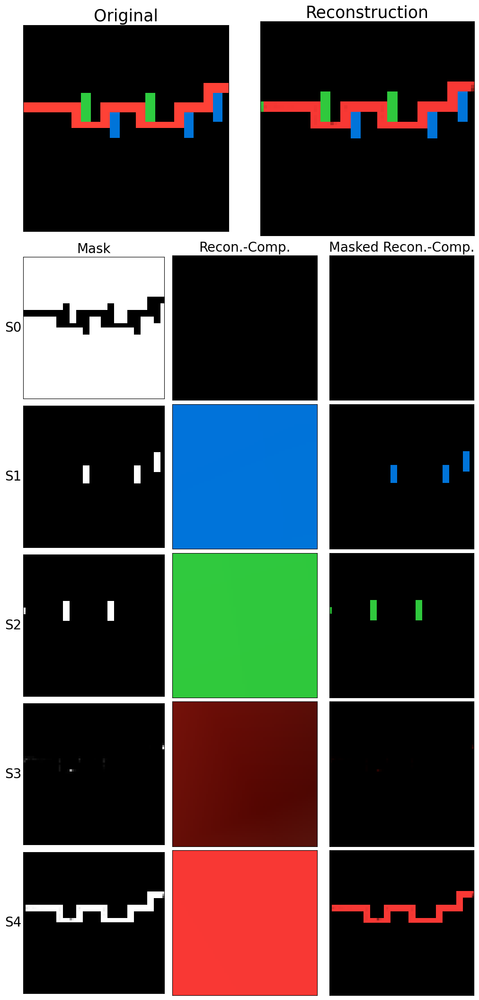

Sample #4:


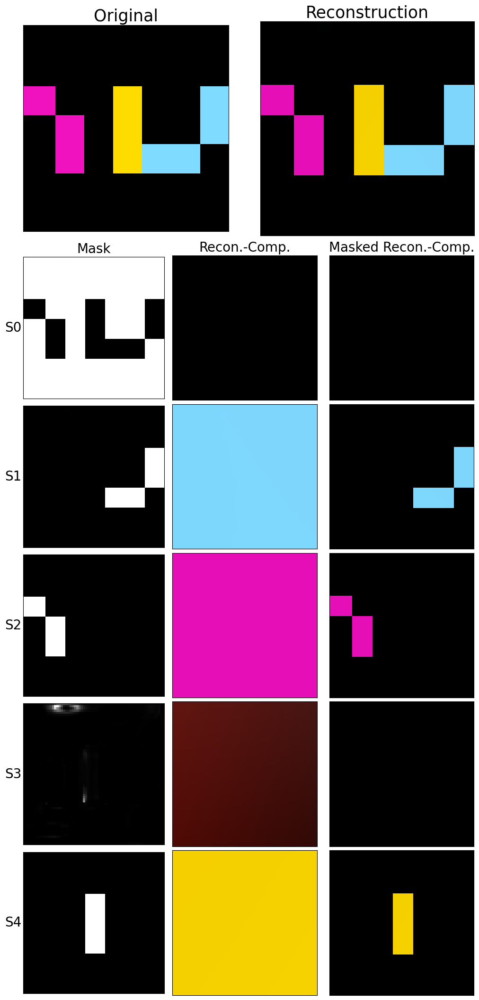

Sample #5:


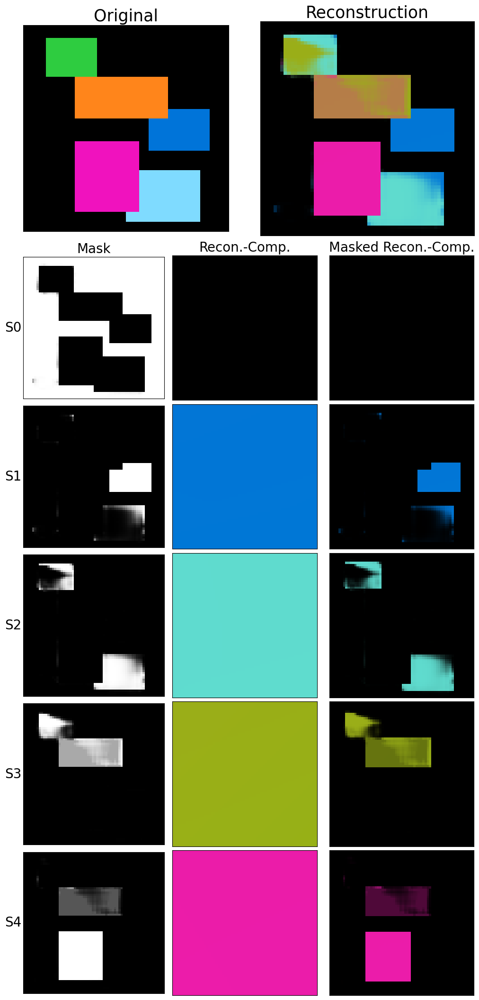

Sample #6:


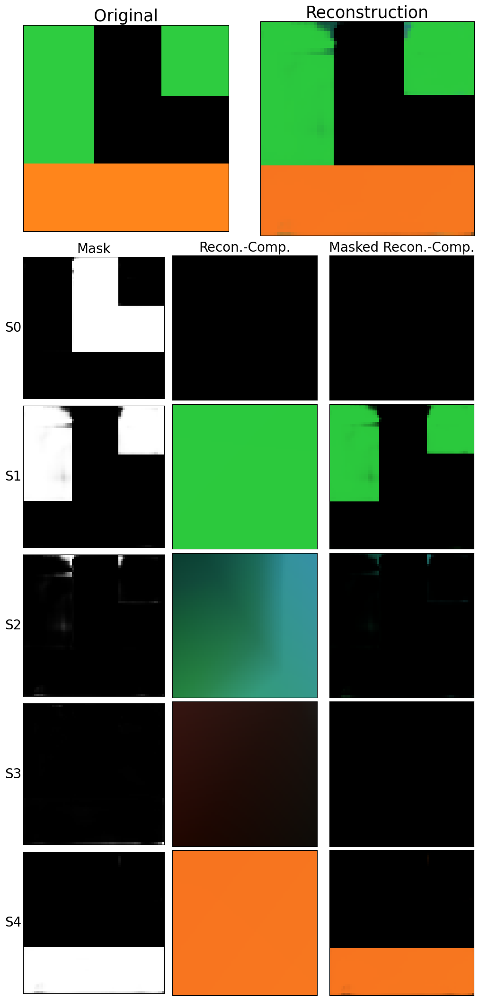

Sample #7:


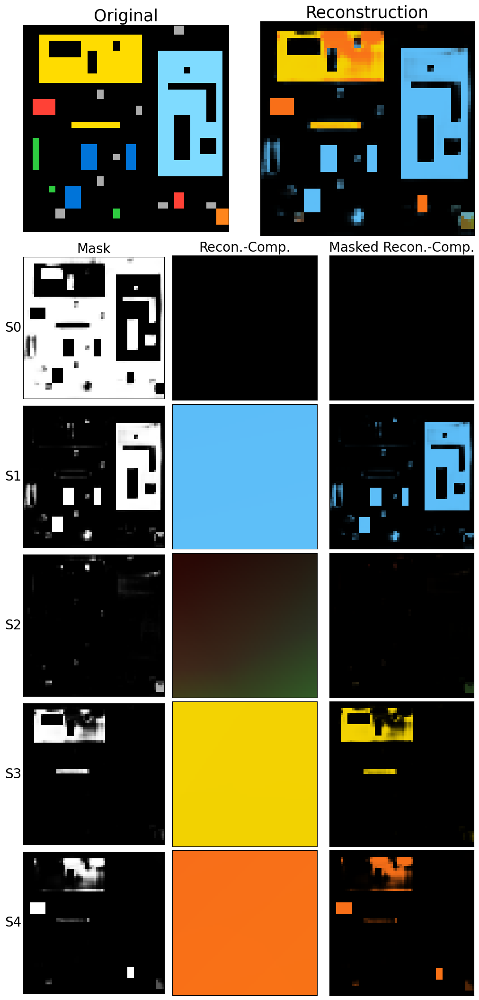

Sample #8:


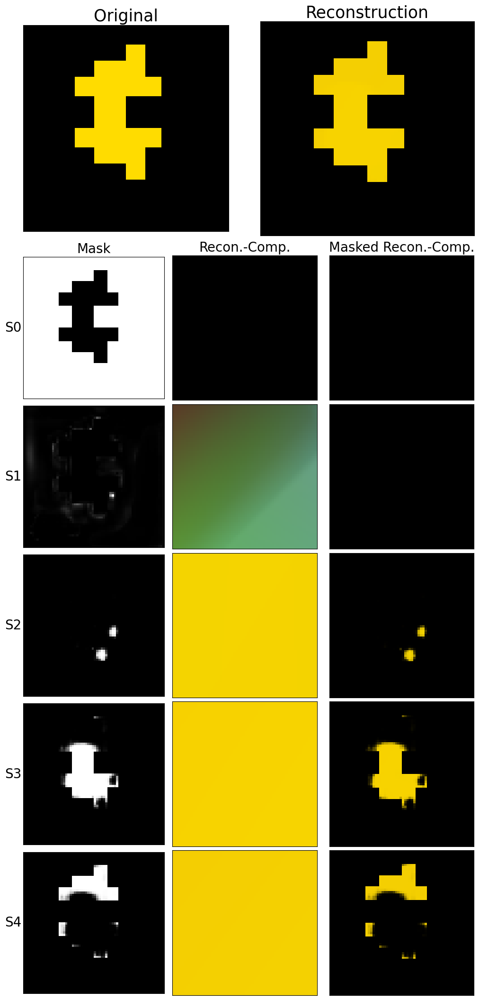

Sample #9:


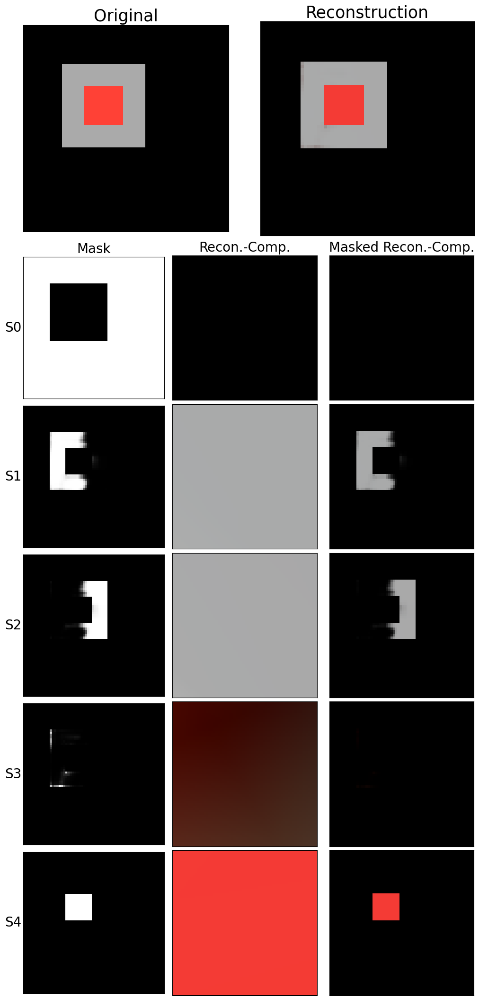

Sample #10:


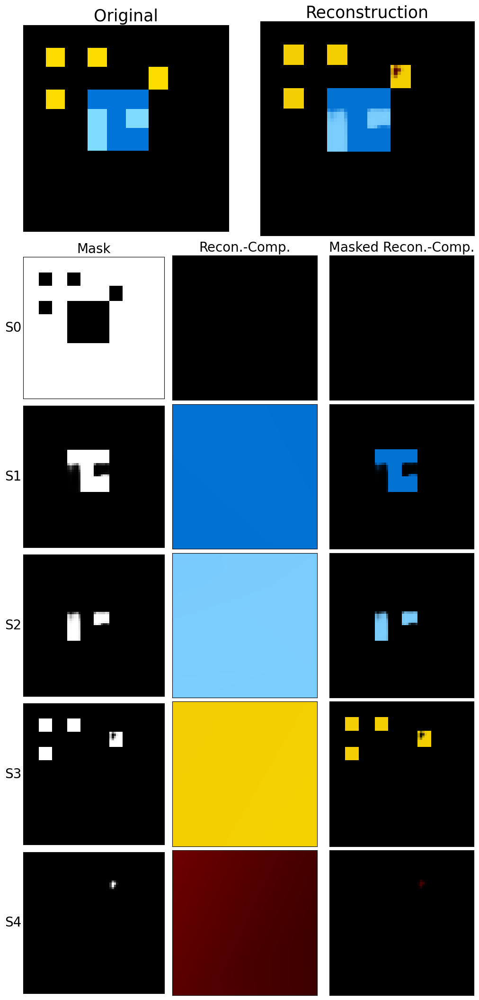

Average MSE Score: 0.00582


In [14]:
# This 5-slot model was trained in batches of 128 images (of 90,000 and 3,436) for 2,000 epochs with a learning rate of 0.0001

name = "MONet_ARCAGI_2"

# Load NoRMask version of model trained on only ARC-AGI
model = monet_normask.MONet_NoRMask(5, 128, 0)
model.load_state_dict(
    torch.load(
        f"models/{name}.pt",
        weights_only=False,
        map_location=torch.device(device),
    )
)
model.eval()

# Load sample testing data
dataset = ARCAGI(
    "datasets",
    version="zoomed",
    split="Test",
)
dataloader = DataLoader(
    dataset,
    batch_size=model.batch_size,
    num_workers=0,
    shuffle=True,
)
images = (next(iter(dataloader))["image"] / 255).to(device)

# Display model outputs
print(f"\n{name} on Testing Data:\n")
show_n_examples_normask(10, model, images)
arc_2_mse = show_metrics_normask(model, dataset)


## Conclusions

Overall, the project was a success. Our reimplementation of the base `MONet` model worked (although quantitative comparison to the version implemented in the original paper is impossible, qualitative inspection of the outputs generated shows that our results seem to be quite similar), and both of our extensions of the model (`NoRMask` and `Mini`) produced strong results consistent with our hypotheses generated from the theoretical bases of our modifications.

Note: 200 random sample outputs for each version of the model are available within the `results/` subdirectory of this repository.
